# Comparing different datasets, sample level, NK cells

- CLR normalized protein data is used in comparisons of surface markers between different datasets in this notebook
- focusing on NK cells 

### Markers selected according to these references #
- Reference 1: Mustjoki group (R-code + other information)
- Reference 2: Pfefferle, A., Netskar, H., Ask, E. H., Lorenz, S., Goodridge, J. P., Sohlberg, E., Clancy, T., & Malmberg, K.-J. (2019). A Temporal Transcriptional Map of Human Natural Killer Cell Differentiation. BioRxiv, 630657. https://doi.org/10.1101/630657

Datasets:

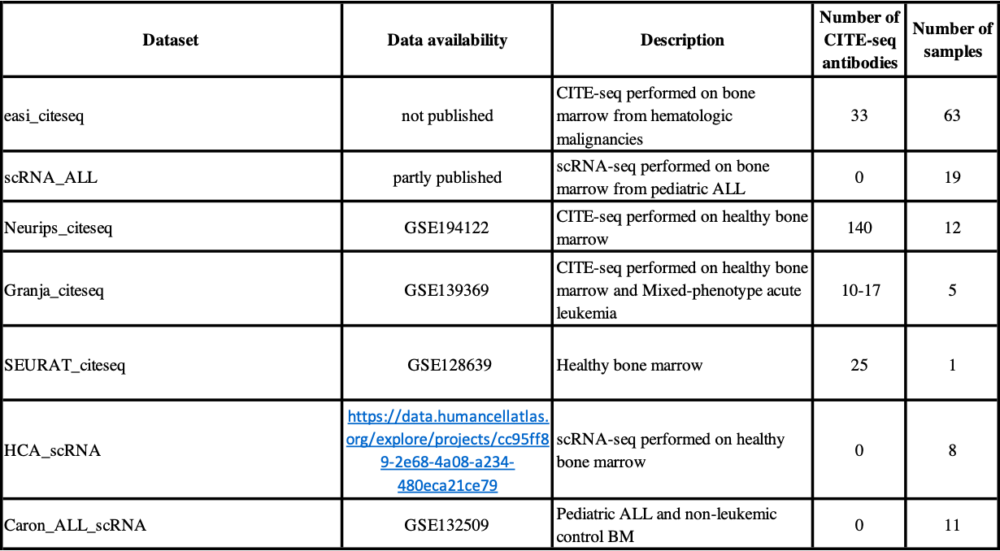

In [226]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap

from ridgeplot import ridgeplot

import warnings

warnings.filterwarnings('ignore')



## File preparations

### Neurips

In [502]:
#Neurips

adata_neurips = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm.h5ad')

In [290]:
adata_neurips.obs['new_cell_type'].unique()

['NK', 'T', 'Prog', 'Myel', 'B', 'DC', 'E', 'Normoblast']
Categories (8, object): ['B', 'DC', 'E', 'Myel', 'NK', 'Normoblast', 'Prog', 'T']

In [291]:
#Select only NK cells

neurips_nk=adata_neurips[adata_neurips.obs['new_cell_type'] == 'NK' ]

In [292]:
neurips_nk

View of AnnData object with n_obs × n_vars = 7388 × 8051
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group'
    uns: 'neighbors', 'new_cell_type_colors', 'umap'
    obsm: 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    obsp: 'connectivities', 'distances'

In [293]:
neurips_nk_prot=neurips_nk.obsm['protein_expression_clr_neurips']

In [294]:
neurips_nk_prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
GTAGTACCAATCCTTT-1-s4d1,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,0.694828,...,0.900688,1.389844,0.918109,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CTGTGGGTCATGCGGC-1-s4d1,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,1.013739,...,0.860303,0.979461,1.147198,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GCAACATTCGCAAGAG-1-s4d1,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,1.072649,...,0.329073,1.280509,0.676616,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TCACGGGTCGCACGAC-1-s4d1,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,0.812797,...,0.576253,1.189870,1.000442,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CGCCAGAAGACCATTC-1-s4d1,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,0.849218,...,0.680162,1.415407,0.729806,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,0.288523,...,0.519947,0.809714,0.357584,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ACATTTCCAGCAGTGA-1-s1d3,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,0.652195,...,0.519947,0.546717,0.194691,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TGAGACTTCCTTCAGC-1-s1d3,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,0.406586,...,0.396827,0.418509,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GAGATGGTCCGCCTAT-1-s1d3,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,0.406586,...,0.576253,0.546717,0.430053,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [295]:
#To exclude columns that contain only zeros

neurips_nk_prot = pd.DataFrame(neurips_nk_prot)
neurips_nk_prot != 0
(neurips_nk_prot != 0).any(axis=0)
neurips_nk_prot.loc[:, (neurips_nk_prot != 0).any(axis=0)]
neurips_nk_prot = neurips_nk_prot.loc[:, (neurips_nk_prot != 0).any(axis=0)]


### Granja

In [296]:
adata_granja = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_granja_norm.h5ad')

In [297]:
adata_granja.obs['cell_type'].unique().to_list()

['CD4+ T 1',
 'CD14+ monocyte 1',
 'Pre B',
 'Pro B',
 'CD8+ T',
 'Promonocyte',
 'CD14+ monocyte 2',
 'Plasmacytoid dendritic cell',
 'NK T 2',
 'Immature B',
 'Late erythoid precursor 1',
 'Pre B (cycling)',
 'NK',
 'Late erythoid precursor 3',
 'Early erythoid precursor',
 'CD16+ monocyte',
 'Conventional dendritic cell',
 'HSC',
 'NK T 1',
 'Late erythoid precursor 2',
 'Plasma B cell',
 'Stromal cell',
 'Megakaryocyte',
 nan]

In [298]:
#Select NK cells
granja_nk=adata_granja[adata_granja.obs['new_cell_type'] == 'NK' ]

In [299]:
granja_nk

View of AnnData object with n_obs × n_vars = 1033 × 8051
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group'
    uns: 'neighbors', 'new_cell_type_colors', 'umap'
    obsm: 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_granja'
    obsp: 'connectivities', 'distances'

In [300]:
granja_nk_prot=granja_nk.obsm['protein_expression_clr_granja']

granja_nk_prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
BMMC_D1T1:AAAGAACTCGAAGAAT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.346739,0.0,0.0
BMMC_D1T1:AAAGGGCAGAAGTGTT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.927923,0.0,0.0
BMMC_D1T1:AAAGTCCGTCGGAAAC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.890060,0.0,0.0
BMMC_D1T1:AAAGTGAGTTACCCAA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.346739,0.0,0.0
BMMC_D1T1:AACAAAGAGTCTGCGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.016744,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BMMC_D1T2:TTTACTGGTCAGGAGT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.830436,0.0,0.0
BMMC_D1T2:TTTCACACAACGCATT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.144246,0.0,0.0
BMMC_D1T2:TTTCAGTTCCAACACA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.744967,0.0,0.0
BMMC_D1T2:TTTCAGTTCTCGGCTT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.809744,0.0,0.0


In [301]:
#To exclude columns that contain only zeros

granja_nk_prot = pd.DataFrame(granja_nk_prot)
granja_nk_prot != 0
(granja_nk_prot != 0).any(axis=0)
granja_nk_prot.loc[:, (granja_nk_prot != 0).any(axis=0)]
granja_nk_prot = granja_nk_prot.loc[:, (granja_nk_prot != 0).any(axis=0)]


### Easigenomics

### Comments:

- Only NKT annotation available (NK- + T-cells)

In [302]:
adata_easi = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_easi_norm.h5ad')

In [303]:
adata_easi.obs['cell_type'].unique().to_list()

['NKT',
 'non-leukemic',
 'preleukemic',
 'non-leukemic?',
 nan,
 'leukemic',
 'leukemic?',
 'doublets?',
 'unknown',
 '0',
 'preleukemic?']

In [304]:
#Select NK + T

easi_nkt=adata_easi[adata_easi.obs['cell_type'] == 'NKT' ]

In [305]:
easi_nkt

View of AnnData object with n_obs × n_vars = 27738 × 8051
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group'
    uns: 'neighbors', 'new_cell_type_colors', 'umap'
    obsm: 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr', 'protein_expression_dsb'
    obsp: 'connectivities', 'distances'

In [306]:
easi_nkt_prot=easi_nkt.obsm['protein_expression_clr']

easi_nkt_prot

,CD19,CD10,CD20,CD3,CD2,CD11b,HLADR,CD38,CD11c,CD7,...,CD5,CD15,CD64,CD117,CD24,CD44,CD58,CD66ace,CD13,CD34
AAACCTGAGCCCTAAT-1-100,0.478646,0.589328,0.507486,0.418344,1.800515,0.735300,0.821979,0.386772,0.779578,1.667181,...,0.507486,1.108744,0.640390,0.418344,0.285596,2.054122,0.589328,0.779578,0.285596,0.779578
AAACCTGCAGACGCTC-1-100,0.332147,0.357515,0.694546,0.540162,1.879650,0.600883,0.888949,0.453003,0.694546,2.364060,...,1.135601,1.039049,0.164727,0.406398,0.382255,2.121294,0.429972,0.560815,0.194650,0.796464
AAACCTGTCCTTAATC-1-100,0.363054,0.530829,0.530829,0.363054,1.853775,0.651907,0.800025,0.332136,0.857352,1.225956,...,1.088464,0.838606,0.422162,0.363054,0.267275,2.193482,0.696512,0.556246,0.123380,0.780162
AAACGGGGTCTCTCGT-1-100,0.345256,0.537805,0.469869,0.699197,2.790828,0.580660,0.735780,0.290712,0.559462,1.266690,...,1.055818,0.960086,0.345256,0.233019,0.371452,3.018252,0.345256,0.661225,0.139715,0.580660
AAAGATGTCCAGTAGT-1-100,0.318489,0.283800,0.171871,0.611861,2.949483,0.878145,0.817923,0.352015,0.636968,0.731533,...,0.775660,1.164216,0.318489,0.504607,0.247864,3.084753,0.611861,0.532518,0.247864,0.708717
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTAGGCACAGAAGCAC-1-158,0.340343,2.252768,0.449547,1.323601,1.740991,0.719847,0.831768,0.150291,0.963831,1.501118,...,0.449547,0.547991,0.150291,0.280917,0.449547,2.589648,0.340343,0.280917,0.077966,0.795835
TTCTACAGTGAGCGAT-1-158,0.573392,1.834990,0.805958,1.371751,2.396818,0.696421,0.734282,0.074576,0.381558,1.659849,...,1.022751,0.433076,0.327242,0.074576,0.143975,3.181108,0.657069,0.433076,0.000000,0.616106
TTGAACGAGCGGATCA-1-158,0.805655,1.364387,1.010871,0.984009,3.220271,0.547156,0.588433,0.310543,0.504102,0.628074,...,1.306933,0.362557,0.547156,0.070303,0.070303,3.536822,0.135986,0.504102,0.135986,0.547156
TTGCCGTAGATCCGAG-1-158,0.684616,2.130814,0.552307,1.000730,3.025827,0.366277,0.844607,0.219740,0.399785,2.272088,...,0.659517,0.432208,0.552307,0.179486,0.179486,3.592897,0.295690,0.331606,0.179486,0.756338


In [307]:
#To exclude columns that contain only zeros

easi_nkt_prot = pd.DataFrame(easi_nkt_prot)
easi_nkt_prot != 0
(easi_nkt_prot != 0).any(axis=0)
easi_nkt_prot.loc[:, (easi_nkt_prot != 0).any(axis=0)]
easi_nkt_prot = easi_nkt_prot.loc[:, (easi_nkt_prot != 0).any(axis=0)]

for col in easi_nkt_prot:
    print(col)

CD19
CD10
CD20
CD3
CD2
CD11b
HLADR
CD38
CD11c
CD7
CD45
CD33
CD81
CD73
CD123
CD14
CD45RA
CD45RO
CD4
CD8a
CD197
CD127
CD56
CD5
CD15
CD64
CD117
CD24
CD44
CD58
CD66ace
CD13
CD34


### Seurat 

In [308]:
#Seurat

adata_seurat = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_seurat_norm.h5ad')

In [309]:
adata_seurat.obs['cell_type'].unique().to_list()

['Prog_RBC',
 'gdT',
 'CD4 Naive',
 'CD4 Memory',
 'CD14 Mono',
 'Naive B',
 'CD8 Naive',
 'Treg',
 'CD8 Effector_2',
 'NK',
 'GMP',
 'CD8 Effector_1',
 'CD16 Mono',
 'pDC',
 'CD8 Memory_1',
 'MAIT',
 'Memory B',
 'cDC2',
 'CD56 bright NK',
 'Prog_B 2',
 'Prog_Mk',
 'CD8 Memory_2',
 'Plasmablast',
 'HSC',
 'LMPP',
 'Prog_DC',
 'Prog_B 1']

In [310]:
#Select NK-cells

seurat_nk=adata_seurat[adata_seurat.obs['new_cell_type'] == 'NK' ]

In [311]:
seurat_nk

View of AnnData object with n_obs × n_vars = 1355 × 8051
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group'
    uns: 'neighbors', 'new_cell_type_colors', 'umap'
    obsm: 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_seurat'
    obsp: 'connectivities', 'distances'

In [312]:
seurat_nk_prot=seurat_nk.obsm['protein_expression_clr_seurat']

seurat_nk_prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
a_AAACCTGTCTAACGGT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.575796,0.555985,0.0,0.0,0.0,0.0,0.0
a_AAACGGGGTTCGGCAC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.249285,0.000000,0.0,0.0,0.0,0.0,0.0
a_AAAGCAAAGACCTAGG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.402419,0.475269,0.0,0.0,0.0,0.0,0.0
a_AAAGCAAAGCGTCAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.938870,0.700162,0.0,0.0,0.0,0.0,0.0
a_AAAGCAACAATGTTGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.614819,0.555985,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b_TTTATGCTCAACACAC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.614819,0.387462,0.0,0.0,0.0,0.0,0.0
b_TTTCCTCAGATCCCGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.192545,0.883647,0.0,0.0,0.0,0.0,0.0
b_TTTCCTCAGTACATGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.575796,0.291195,0.0,0.0,0.0,0.0,0.0
b_TTTGCGCGTGGTCTCG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.302978,0.387462,0.0,0.0,0.0,0.0,0.0


In [313]:
#To exclude columns that contain only zeros

seurat_nk_prot = pd.DataFrame(seurat_nk_prot)
seurat_nk_prot != 0
(seurat_nk_prot != 0).any(axis=0)
seurat_nk_prot.loc[:, (seurat_nk_prot != 0).any(axis=0)]
seurat_nk_prot = seurat_nk_prot.loc[:, (seurat_nk_prot != 0).any(axis=0)]


## Comparisons

In [314]:
#NK cell markers (Reference 1)

nk_immature = ['CD56']
nk_activating= ['CD335', 'CD314', 'CD2', 'CD226']
nk_maturation= ['CD57']
# nk_inhibitory= ['CD158A', 'CD158B2', 'CD158E1'] these markers not found in Neurips data

nk_mustjoki = [nk_immature, nk_activating, nk_maturation]
nk_mustjoki = list(np.concatenate(nk_mustjoki).flat)



In [315]:
#NK cell markers (Reference 2) used in Neurips antibody panel

nk_immature_pfef = ['CD56']
nk56dim = ['CD94','CD158b', 'CD57']

# nk_adaptive =['CD158b', 'CD159c, CD57'] CD159c not used in Neurips, so this is same as previous

nk_transition= ['TIGIT', 'CD155', 'CD226', 'CD161'] 

c1_pfef = ['CD195', 'CD122', 'CD94']
c2_pfef = ['CD62L', 'CD127', 'CD27', 'TIGIT']
c3_pfef = ['CD16', 'CD38']

pseudotime= ['CD161', 'CD94', 'CD56', 'CD5', 'CD7', 'CD122']


#bigger list including all markers

nk_pfef=[nk_immature, nk56dim, nk_transition, c1_pfef, c2_pfef, c3_pfef, pseudotime]
nk_pfef = list(np.concatenate(nk_pfef).flat)

In [316]:
nk_all = [nk_mustjoki, nk_pfef]
nk_all = list(np.concatenate(nk_all).flat)

In [317]:
#creating one list, each marker only once in the list
nk_both = []

for marker in nk_mustjoki:
    if marker not in nk_pfef:
        nk_both.append(marker)
 

In [318]:
nk_all = [nk_both, nk_pfef]

In [319]:
nk_all = list(np.concatenate(nk_all).flat)

In [320]:
nk_all

['CD335',
 'CD314',
 'CD2',
 'CD56',
 'CD94',
 'CD158b',
 'CD57',
 'TIGIT',
 'CD155',
 'CD226',
 'CD161',
 'CD195',
 'CD122',
 'CD94',
 'CD62L',
 'CD127',
 'CD27',
 'TIGIT',
 'CD16',
 'CD38',
 'CD161',
 'CD94',
 'CD56',
 'CD5',
 'CD7',
 'CD122']

In [321]:
#Used to check which markers were used in Neurips

listOfmarkers= nk_all

nk_all= []

for x in listOfmarkers:
    if x in neurips_nk_prot.columns:
        print(x, "Yes")
        nk_all.append(x)
    else:
        print(x, "No") 
        
print(nk_all)

CD335 Yes
CD314 Yes
CD2 Yes
CD56 Yes
CD94 Yes
CD158b Yes
CD57 Yes
TIGIT Yes
CD155 Yes
CD226 Yes
CD161 Yes
CD195 Yes
CD122 Yes
CD94 Yes
CD62L Yes
CD127 Yes
CD27 Yes
TIGIT Yes
CD16 Yes
CD38 Yes
CD161 Yes
CD94 Yes
CD56 Yes
CD5 Yes
CD7 Yes
CD122 Yes
['CD335', 'CD314', 'CD2', 'CD56', 'CD94', 'CD158b', 'CD57', 'TIGIT', 'CD155', 'CD226', 'CD161', 'CD195', 'CD122', 'CD94', 'CD62L', 'CD127', 'CD27', 'TIGIT', 'CD16', 'CD38', 'CD161', 'CD94', 'CD56', 'CD5', 'CD7', 'CD122']


### Neurips

In [322]:
samples=adata_neurips.obs['POOL'].unique().tolist()
samples

['s4d1',
 's3d6',
 's1d2',
 's2d1',
 's3d7',
 's2d4',
 's1d1',
 's4d9',
 's4d8',
 's2d5',
 's3d1',
 's1d3']

In [323]:
#save means of protein counts/each protein/each sample into a list

list_samples= []

for sample in samples:
    eg=adata_neurips[adata_neurips.obs['new_cell_type'] == 'NK']
    eg=adata_neurips[adata_neurips.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression_clr_neurips']
    prot_mean=prot.mean(axis=0).sort_values()
    list_samples.append(prot_mean)

    

In [324]:
list_samples

[CD66ace    0.000000
 CD15       0.000000
 CD90       0.000000
 CD10       0.000000
 CD34       0.000000
              ...   
 CD81       1.838738
 CD44       1.848751
 CD11a      1.896102
 CD196      1.933688
 CD7        1.938531
 Length: 141, dtype: float64,
 CD66ace    0.000000
 CD15       0.000000
 CD90       0.000000
 CD10       0.000000
 CD34       0.000000
              ...   
 CD152      0.564546
 CD35       0.570928
 CD36       0.577699
 CD154      0.592344
 CD71       0.627537
 Length: 141, dtype: float64,
 CD66ace    0.000000
 CD15       0.000000
 CD90       0.000000
 CD10       0.000000
 CD34       0.000000
              ...   
 CD7        1.980217
 CD11a      2.057640
 CD45       2.063965
 CD45RA     2.242679
 CD2        2.300188
 Length: 141, dtype: float64,
 CD66ace    0.000000
 CD15       0.000000
 CD90       0.000000
 CD10       0.000000
 CD34       0.000000
              ...   
 CD196      0.761532
 CD41       0.800500
 CD36       0.855050
 CD274      0.863264
 CD71  

In [325]:
all_cells_neurips=[]
nk_cell_neurips=[]

for sample in samples:
    all_cells_neurips.append(len(adata_neurips[adata_neurips.obs['POOL'] == sample]))
    nk_cell_neurips.append(len(neurips_nk[neurips_nk.obs['POOL'] == sample]))

print(all_cells_neurips)
print(nk_cell_neurips)
    

[4885, 10316, 4450, 9684, 10802, 4575, 4123, 6565, 3535, 8725, 8478, 4860]
[665, 846, 518, 529, 1198, 151, 202, 730, 262, 1814, 210, 263]


In [326]:
#save column names
proteins=adata_neurips.obsm['protein_expression_clr_neurips'].columns

In [327]:
#creating a dataframe from list of lists

df = pd.DataFrame(list_samples, columns = proteins)

df

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
0,0.895104,1.189739,1.431274,0.959103,1.423356,1.610546,1.551237,1.273979,1.581697,1.483163,...,1.233131,1.363683,1.371288,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.266120,0.362233,0.447834,0.372926,0.517766,0.200408,0.241528,0.382664,0.592344,0.233782,...,0.341494,0.462034,0.395035,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.855378,0.489304,1.042133,0.809750,0.695703,1.822831,1.917319,0.788135,0.750166,1.685569,...,1.515123,1.029190,1.022285,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.304920,0.863264,0.320968,0.312393,0.312486,0.412130,0.479024,0.349662,0.312091,0.341292,...,0.525217,0.492511,0.453009,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.434874,0.242130,0.397698,0.478733,0.450838,0.250612,0.300017,0.369944,0.507438,0.296629,...,0.582983,0.467519,0.516212,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.462556,0.794630,0.564187,0.538056,0.626719,0.539152,0.538759,0.499619,0.582696,0.465571,...,0.547594,0.577559,0.668187,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.842188,0.494847,1.150031,0.746303,0.746231,1.986176,1.863593,1.158310,0.791760,1.705259,...,1.297903,1.088376,1.151568,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.443531,1.836577,0.986132,0.619925,0.915948,1.483739,1.230548,0.878292,0.965032,1.616639,...,0.644672,0.955541,1.061812,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.875111,1.106390,1.459663,0.966311,1.179768,2.338416,2.299416,1.284024,1.222709,2.338197,...,1.476439,1.357387,1.370985,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.443664,0.324868,0.358401,0.313137,0.435451,0.519450,0.701653,0.389406,0.328078,0.495900,...,0.747098,0.398308,0.534604,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [328]:
df=df.T

df

,0,1,2,3,4,5,6,7,8,9,10,11
CD86,0.895104,0.266120,0.855378,0.304920,0.434874,0.462556,0.842188,0.443531,0.875111,0.443664,0.693688,0.429625
CD274,1.189739,0.362233,0.489304,0.863264,0.242130,0.794630,0.494847,1.836577,1.106390,0.324868,0.724929,0.525297
CD270,1.431274,0.447834,1.042133,0.320968,0.397698,0.564187,1.150031,0.986132,1.459663,0.358401,0.998968,1.068786
CD155,0.959103,0.372926,0.809750,0.312393,0.478733,0.538056,0.746303,0.619925,0.966311,0.313137,0.757450,0.647368
CD112,1.423356,0.517766,0.695703,0.312486,0.450838,0.626719,0.746231,0.915948,1.179768,0.435451,1.091616,0.690158
...,...,...,...,...,...,...,...,...,...,...,...,...
CD10,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD90,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD15,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD117,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [329]:
#add column names

df.columns=samples

df

,s4d1,s3d6,s1d2,s2d1,s3d7,s2d4,s1d1,s4d9,s4d8,s2d5,s3d1,s1d3
CD86,0.895104,0.266120,0.855378,0.304920,0.434874,0.462556,0.842188,0.443531,0.875111,0.443664,0.693688,0.429625
CD274,1.189739,0.362233,0.489304,0.863264,0.242130,0.794630,0.494847,1.836577,1.106390,0.324868,0.724929,0.525297
CD270,1.431274,0.447834,1.042133,0.320968,0.397698,0.564187,1.150031,0.986132,1.459663,0.358401,0.998968,1.068786
CD155,0.959103,0.372926,0.809750,0.312393,0.478733,0.538056,0.746303,0.619925,0.966311,0.313137,0.757450,0.647368
CD112,1.423356,0.517766,0.695703,0.312486,0.450838,0.626719,0.746231,0.915948,1.179768,0.435451,1.091616,0.690158
...,...,...,...,...,...,...,...,...,...,...,...,...
CD10,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD90,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD15,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CD117,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [330]:
df=df.T

df

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
s4d1,0.895104,1.189739,1.431274,0.959103,1.423356,1.610546,1.551237,1.273979,1.581697,1.483163,...,1.233131,1.363683,1.371288,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s3d6,0.266120,0.362233,0.447834,0.372926,0.517766,0.200408,0.241528,0.382664,0.592344,0.233782,...,0.341494,0.462034,0.395035,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s1d2,0.855378,0.489304,1.042133,0.809750,0.695703,1.822831,1.917319,0.788135,0.750166,1.685569,...,1.515123,1.029190,1.022285,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s2d1,0.304920,0.863264,0.320968,0.312393,0.312486,0.412130,0.479024,0.349662,0.312091,0.341292,...,0.525217,0.492511,0.453009,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s3d7,0.434874,0.242130,0.397698,0.478733,0.450838,0.250612,0.300017,0.369944,0.507438,0.296629,...,0.582983,0.467519,0.516212,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s2d4,0.462556,0.794630,0.564187,0.538056,0.626719,0.539152,0.538759,0.499619,0.582696,0.465571,...,0.547594,0.577559,0.668187,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s1d1,0.842188,0.494847,1.150031,0.746303,0.746231,1.986176,1.863593,1.158310,0.791760,1.705259,...,1.297903,1.088376,1.151568,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s4d9,0.443531,1.836577,0.986132,0.619925,0.915948,1.483739,1.230548,0.878292,0.965032,1.616639,...,0.644672,0.955541,1.061812,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s4d8,0.875111,1.106390,1.459663,0.966311,1.179768,2.338416,2.299416,1.284024,1.222709,2.338197,...,1.476439,1.357387,1.370985,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s2d5,0.443664,0.324868,0.358401,0.313137,0.435451,0.519450,0.701653,0.389406,0.328078,0.495900,...,0.747098,0.398308,0.534604,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [331]:
#remove columns that contain only zeros

df = pd.DataFrame(df)
df != 0
(df != 0).any(axis=0)
df.loc[:, (df != 0).any(axis=0)]
df = df.loc[:, (df != 0).any(axis=0)]

df

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD94,CD162,CD85j,CD23,CD328,HLA-E,CD82,CD101,CD88,CD224
s4d1,0.895104,1.189739,1.431274,0.959103,1.423356,1.610546,1.551237,1.273979,1.581697,1.483163,...,1.526385,1.543646,1.385880,1.559544,1.151442,1.409931,1.307357,1.233131,1.363683,1.371288
s3d6,0.266120,0.362233,0.447834,0.372926,0.517766,0.200408,0.241528,0.382664,0.592344,0.233782,...,0.522641,0.276845,0.402666,0.542062,0.387210,0.411889,0.316679,0.341494,0.462034,0.395035
s1d2,0.855378,0.489304,1.042133,0.809750,0.695703,1.822831,1.917319,0.788135,0.750166,1.685569,...,1.193853,1.880924,0.861575,0.722434,1.293723,1.115665,1.532486,1.515123,1.029190,1.022285
s2d1,0.304920,0.863264,0.320968,0.312393,0.312486,0.412130,0.479024,0.349662,0.312091,0.341292,...,0.328892,0.543683,0.293669,0.341320,0.538204,0.286060,0.578680,0.525217,0.492511,0.453009
s3d7,0.434874,0.242130,0.397698,0.478733,0.450838,0.250612,0.300017,0.369944,0.507438,0.296629,...,0.417759,0.382375,0.436922,0.471161,0.734983,0.395613,0.372450,0.582983,0.467519,0.516212
s2d4,0.462556,0.794630,0.564187,0.538056,0.626719,0.539152,0.538759,0.499619,0.582696,0.465571,...,0.539444,0.503476,0.471273,0.591001,0.591720,0.471135,0.677364,0.547594,0.577559,0.668187
s1d1,0.842188,0.494847,1.150031,0.746303,0.746231,1.986176,1.863593,1.158310,0.791760,1.705259,...,0.685628,1.692155,1.000333,0.785267,1.057010,1.103007,1.908518,1.297903,1.088376,1.151568
s4d9,0.443531,1.836577,0.986132,0.619925,0.915948,1.483739,1.230548,0.878292,0.965032,1.616639,...,1.075522,1.048972,0.824513,1.023346,0.614243,1.053153,0.861048,0.644672,0.955541,1.061812
s4d8,0.875111,1.106390,1.459663,0.966311,1.179768,2.338416,2.299416,1.284024,1.222709,2.338197,...,1.404772,2.033315,1.282257,1.301435,1.101627,1.747363,1.335745,1.476439,1.357387,1.370985
s2d5,0.443664,0.324868,0.358401,0.313137,0.435451,0.519450,0.701653,0.389406,0.328078,0.495900,...,0.481035,0.766080,0.315536,0.339208,0.794832,0.364119,0.403200,0.747098,0.398308,0.534604


In [332]:
index_sort = df.mean().sort_values().index
df_sorted = df[index_sort]

df_sorted

,TCRVd2,CD194,TCRVa7.2,CD42b,CD158e1,CD25,CD1c,CD146,CD103,IgD,...,CD47,HLA-A-B-C,CD44,CD81,CD11a,CD45RA,CD7,CD2,CD45,CD5
s4d1,0.665076,0.958827,0.905964,1.043606,1.091735,1.080279,0.905249,1.049192,1.065979,0.930738,...,1.610546,1.760489,1.848751,1.838738,1.896102,1.483842,1.938531,1.660241,1.684020,1.766428
s3d6,0.158318,0.218237,0.238211,0.295162,0.302102,0.254409,0.218034,0.302837,0.325588,0.120745,...,0.200408,0.228202,0.207254,0.297849,0.288648,0.424696,0.293036,0.341791,0.229554,0.286301
s1d2,0.316631,0.575823,0.445114,0.529079,0.512646,0.595072,0.564102,0.612642,0.648368,0.511047,...,1.822831,1.627263,1.909522,1.787953,2.057640,2.242679,1.980217,2.300188,2.063965,1.840709
s2d1,0.073591,0.268547,0.119025,0.219541,0.182849,0.255392,0.206386,0.186954,0.200278,0.271968,...,0.412130,0.346285,0.395398,0.250911,0.362868,0.396372,0.296759,0.303741,0.374771,0.429235
s3d7,0.137893,0.193026,0.206742,0.272644,0.234811,0.203448,0.226082,0.256404,0.286846,0.122100,...,0.250612,0.293415,0.294397,0.244202,0.399151,0.392966,0.181030,0.208118,0.282711,0.198172
s2d4,0.194087,0.404011,0.214715,0.301287,0.315190,0.280196,0.302109,0.291323,0.333655,0.346982,...,0.539152,0.474773,0.496273,0.458739,0.498955,0.502431,0.408966,0.452069,0.511406,0.472912
s1d1,0.304384,0.672118,0.429427,0.565049,0.497007,0.722347,0.819291,0.625665,0.687057,1.066962,...,1.986176,1.906951,2.011889,1.655031,1.873453,1.820197,1.779618,1.754938,2.035544,1.904649
s4d9,0.323518,0.434092,0.574719,0.498799,0.655788,0.611487,0.668388,0.559020,0.600221,1.148763,...,1.483739,1.671932,1.606962,1.891398,1.387226,1.545636,1.931010,1.627833,1.663338,1.674751
s4d8,0.483149,0.711207,1.562635,0.768313,0.830868,0.803593,0.853610,0.930567,0.928822,1.031492,...,2.338416,2.599331,2.389188,2.770256,2.530337,1.872543,2.021836,2.367131,2.514055,2.219946
s2d5,0.083282,0.304008,0.124636,0.325668,0.347092,0.172981,0.185343,0.184192,0.196218,0.095083,...,0.519450,0.463481,0.496405,0.366651,0.575098,0.595833,0.588660,0.524069,0.576690,0.521419


In [333]:
df_sorted=df_sorted.T

df_sorted

,s4d1,s3d6,s1d2,s2d1,s3d7,s2d4,s1d1,s4d9,s4d8,s2d5,s3d1,s1d3
TCRVd2,0.665076,0.158318,0.316631,0.073591,0.137893,0.194087,0.304384,0.323518,0.483149,0.083282,0.453221,0.319533
CD194,0.958827,0.218237,0.575823,0.268547,0.193026,0.404011,0.672118,0.434092,0.711207,0.304008,0.519852,0.449927
TCRVa7.2,0.905964,0.238211,0.445114,0.119025,0.206742,0.214715,0.429427,0.574719,1.562635,0.124636,0.624666,0.488383
CD42b,1.043606,0.295162,0.529079,0.219541,0.272644,0.301287,0.565049,0.498799,0.768313,0.325668,0.766651,0.489900
CD158e1,1.091735,0.302102,0.512646,0.182849,0.234811,0.315190,0.497007,0.655788,0.830868,0.347092,0.697364,0.491751
...,...,...,...,...,...,...,...,...,...,...,...,...
CD45RA,1.483842,0.424696,2.242679,0.396372,0.392966,0.502431,1.820197,1.545636,1.872543,0.595833,0.752543,2.298015
CD7,1.938531,0.293036,1.980217,0.296759,0.181030,0.408966,1.779618,1.931010,2.021836,0.588660,0.548499,2.430537
CD2,1.660241,0.341791,2.300188,0.303741,0.208118,0.452069,1.754938,1.627833,2.367131,0.524069,0.558571,2.320016
CD45,1.684020,0.229554,2.063965,0.374771,0.282711,0.511406,2.035544,1.663338,2.514055,0.576690,0.531815,2.015543


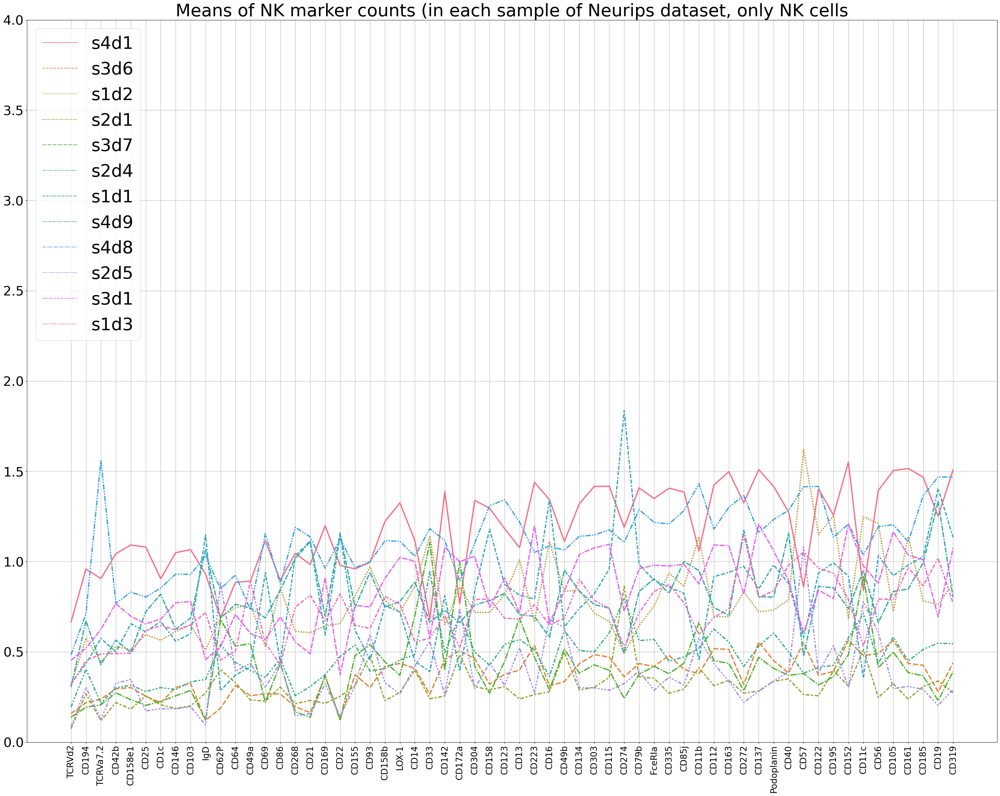

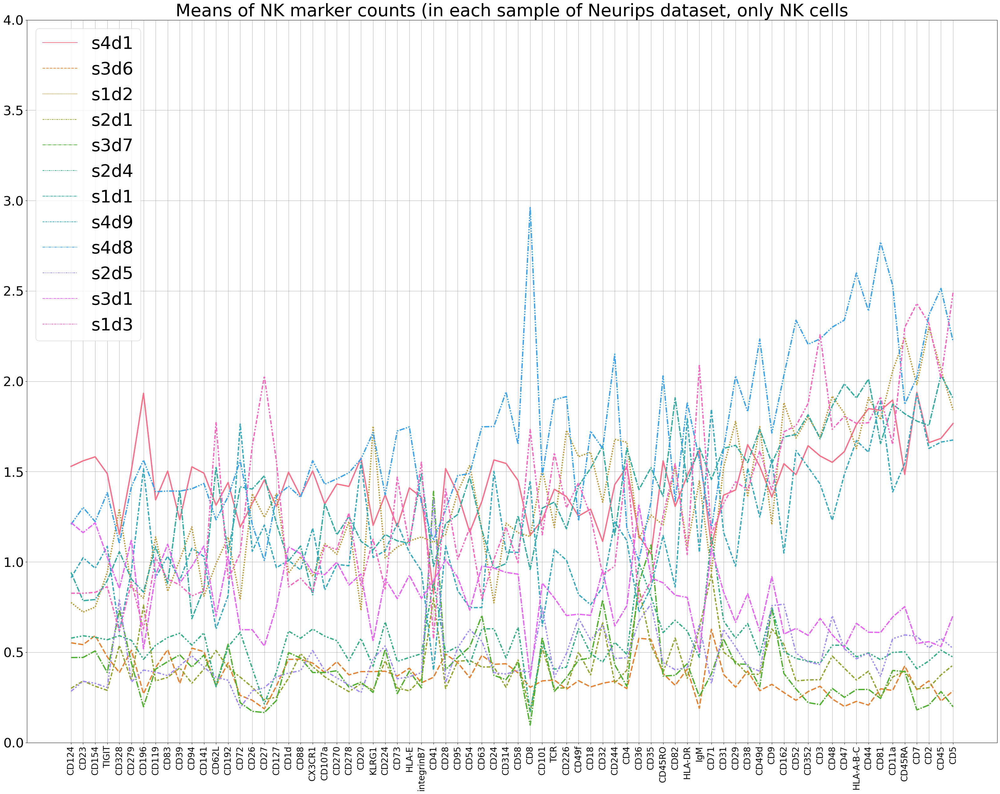

In [334]:
#only NK cells selected from each sample, CLR normalized

palette = sns.color_palette("husl", 12)


plt.figure(figsize=[40,30])
a= sns.lineplot(data=df_sorted.iloc[0:60], palette=palette, linewidth = 3)
a.set_xticklabels(a.get_xticklabels(),rotation=90) 
a.tick_params(axis='x', labelsize=20)
a.tick_params(axis='y', labelsize=30)
plt.ylim(0, 4)
plt.legend(loc='upper left', fontsize = 40, facecolor='white')
plt.grid()
plt.title("Means of NK marker counts (in each sample of Neurips dataset, only NK cells", fontsize=40) ;


plt.figure(figsize=[40,30])
a= sns.lineplot(data=df_sorted.iloc[60:134], palette=palette, linewidth = 3)
a.set_xticklabels(a.get_xticklabels(),rotation=90) 
a.tick_params(axis='x', labelsize=20)
a.tick_params(axis='y', labelsize=30)
plt.ylim(0, 4)
plt.legend(loc='upper left', fontsize = 40, facecolor='white')
plt.grid()
plt.title("Means of NK marker counts (in each sample of Neurips dataset, only NK cells", fontsize=40) ;




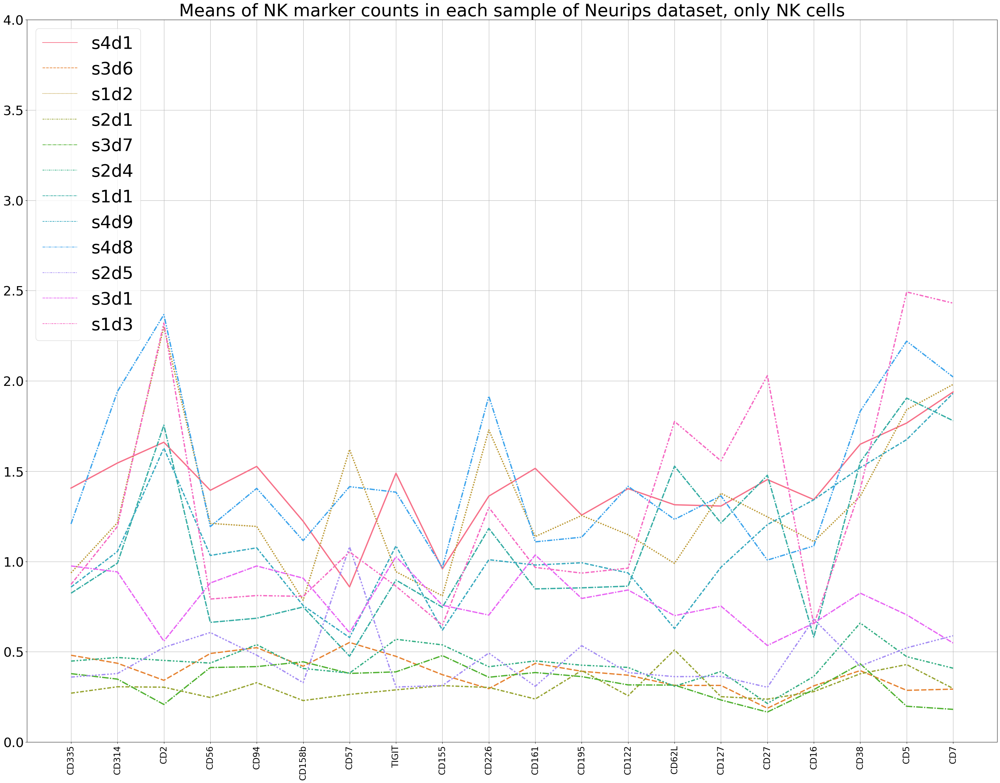

In [335]:
#only NK cells selected from each sample, CLR normalized

palette = sns.color_palette("husl", 12)


plt.figure(figsize=[40,30])
a= sns.lineplot(data=df_sorted.loc[nk_all], palette=palette, linewidth = 3)
a.set_xticklabels(a.get_xticklabels(),rotation=90) 
a.tick_params(axis='x', labelsize=20)
a.tick_params(axis='y', labelsize=30)
plt.ylim(0, 4)
plt.legend(loc='upper left', fontsize = 40, facecolor='white')
plt.grid()
plt.title("Means of NK marker counts in each sample of Neurips dataset, only NK cells", fontsize=40) ;




In [336]:
df_sorted.T

,TCRVd2,CD194,TCRVa7.2,CD42b,CD158e1,CD25,CD1c,CD146,CD103,IgD,...,CD47,HLA-A-B-C,CD44,CD81,CD11a,CD45RA,CD7,CD2,CD45,CD5
s4d1,0.665076,0.958827,0.905964,1.043606,1.091735,1.080279,0.905249,1.049192,1.065979,0.930738,...,1.610546,1.760489,1.848751,1.838738,1.896102,1.483842,1.938531,1.660241,1.684020,1.766428
s3d6,0.158318,0.218237,0.238211,0.295162,0.302102,0.254409,0.218034,0.302837,0.325588,0.120745,...,0.200408,0.228202,0.207254,0.297849,0.288648,0.424696,0.293036,0.341791,0.229554,0.286301
s1d2,0.316631,0.575823,0.445114,0.529079,0.512646,0.595072,0.564102,0.612642,0.648368,0.511047,...,1.822831,1.627263,1.909522,1.787953,2.057640,2.242679,1.980217,2.300188,2.063965,1.840709
s2d1,0.073591,0.268547,0.119025,0.219541,0.182849,0.255392,0.206386,0.186954,0.200278,0.271968,...,0.412130,0.346285,0.395398,0.250911,0.362868,0.396372,0.296759,0.303741,0.374771,0.429235
s3d7,0.137893,0.193026,0.206742,0.272644,0.234811,0.203448,0.226082,0.256404,0.286846,0.122100,...,0.250612,0.293415,0.294397,0.244202,0.399151,0.392966,0.181030,0.208118,0.282711,0.198172
s2d4,0.194087,0.404011,0.214715,0.301287,0.315190,0.280196,0.302109,0.291323,0.333655,0.346982,...,0.539152,0.474773,0.496273,0.458739,0.498955,0.502431,0.408966,0.452069,0.511406,0.472912
s1d1,0.304384,0.672118,0.429427,0.565049,0.497007,0.722347,0.819291,0.625665,0.687057,1.066962,...,1.986176,1.906951,2.011889,1.655031,1.873453,1.820197,1.779618,1.754938,2.035544,1.904649
s4d9,0.323518,0.434092,0.574719,0.498799,0.655788,0.611487,0.668388,0.559020,0.600221,1.148763,...,1.483739,1.671932,1.606962,1.891398,1.387226,1.545636,1.931010,1.627833,1.663338,1.674751
s4d8,0.483149,0.711207,1.562635,0.768313,0.830868,0.803593,0.853610,0.930567,0.928822,1.031492,...,2.338416,2.599331,2.389188,2.770256,2.530337,1.872543,2.021836,2.367131,2.514055,2.219946
s2d5,0.083282,0.304008,0.124636,0.325668,0.347092,0.172981,0.185343,0.184192,0.196218,0.095083,...,0.519450,0.463481,0.496405,0.366651,0.575098,0.595833,0.588660,0.524069,0.576690,0.521419


In [337]:
#saving NK markers from all samples into a list

list_samples=[]

for sample in samples:
    eg=adata_neurips[adata_neurips.obs['new_cell_type'] == 'NK']
    eg=adata_neurips[adata_neurips.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression_clr_neurips']
    prot_marker=prot[nk_all]
    list_samples.append(prot_marker)

In [338]:
#NK markers saved for each sample

s4d1= list_samples[0]
s3d6= list_samples[1]
s1d2= list_samples[2]
s2d1= list_samples[3]
s3d7= list_samples[4]
s2d4= list_samples[5]
s1d1= list_samples[6]
s4d9= list_samples[7]
s4d8= list_samples[8]
s2d5= list_samples[9]
s3d1= list_samples[10]
s1d3= list_samples[11]


In [339]:
s4d1["Sample"] = "s4d1"
s3d6["Sample"] = "s3d6"
s1d2["Sample"] = "s1d2"
s2d1["Sample"] = "s2d1"
s3d7["Sample"] = "s3d7"
s2d4["Sample"] = "s2d4"
s1d1["Sample"] = "s1d1"
s4d9["Sample"] = "s4d9"
s4d8["Sample"] = "s4d8"
s2d5["Sample"] = "s2d5"
s3d1["Sample"] = "s3d1"
s1d3["Sample"] = "s1d3"

In [340]:
df_all=pd.concat([s4d1,s3d6,s1d2,s2d1,s3d7,s2d4,s1d1,s4d9,s4d8,s2d5,s3d1,s1d3])


In [341]:
df_all["CD56"]

,CD56,CD56
GTAGTACCAATCCTTT-1-s4d1,1.601517,1.601517
CTCAAGAGTCACAGAG-1-s4d1,1.365658,1.365658
CTGTGGGTCATGCGGC-1-s4d1,1.922291,1.922291
CGTGATAGTTATCTGG-1-s4d1,1.253163,1.253163
AGATCCAAGATCGGTG-1-s4d1,1.513731,1.513731
...,...,...
GTGGTTAGTCGAGTTT-1-s1d3,0.000000,0.000000
GCTACAACAGTGCGCT-1-s1d3,0.485723,0.485723
AACAAAGGTTGGTACT-1-s1d3,0.000000,0.000000
TGACAGTCATGGCTGC-1-s1d3,1.513731,1.513731


In [343]:
df_all = df_all.T.drop_duplicates().T

In [344]:
df_all.columns

Index(['CD335', 'CD314', 'CD2', 'CD56', 'CD94', 'CD158b', 'CD57', 'TIGIT',
       'CD155', 'CD226', 'CD161', 'CD195', 'CD122', 'CD62L', 'CD127', 'CD27',
       'CD16', 'CD38', 'CD5', 'CD7', 'Sample'],
      dtype='object')

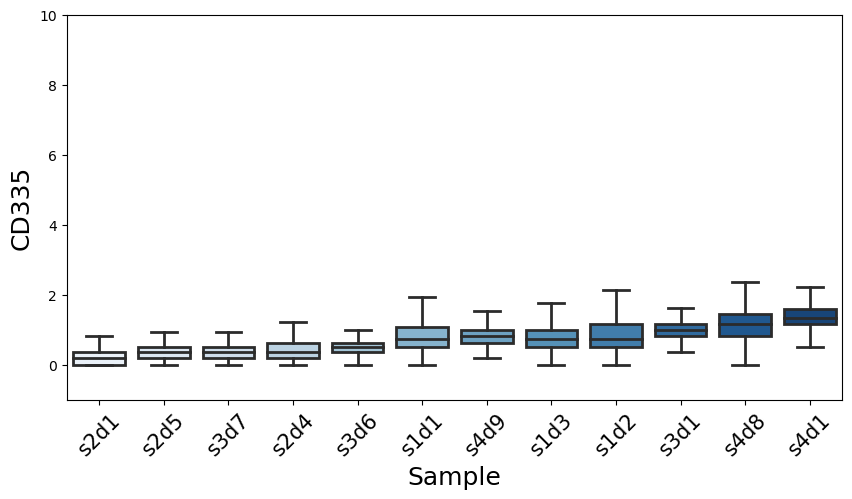

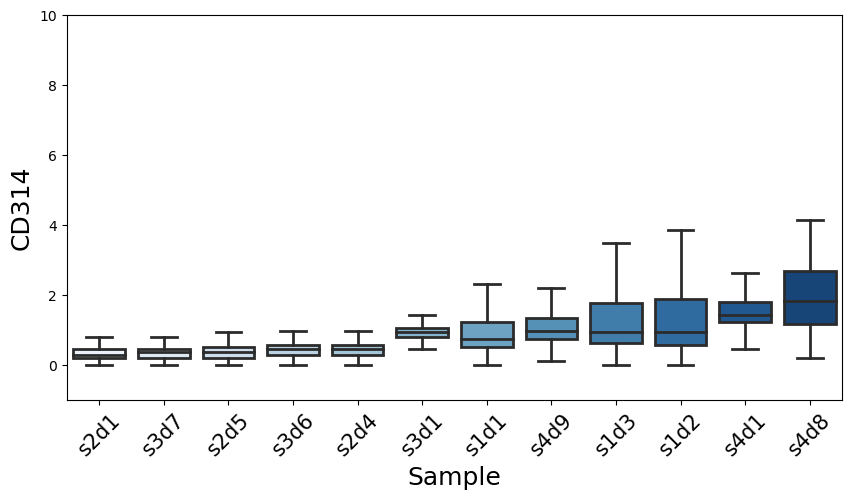

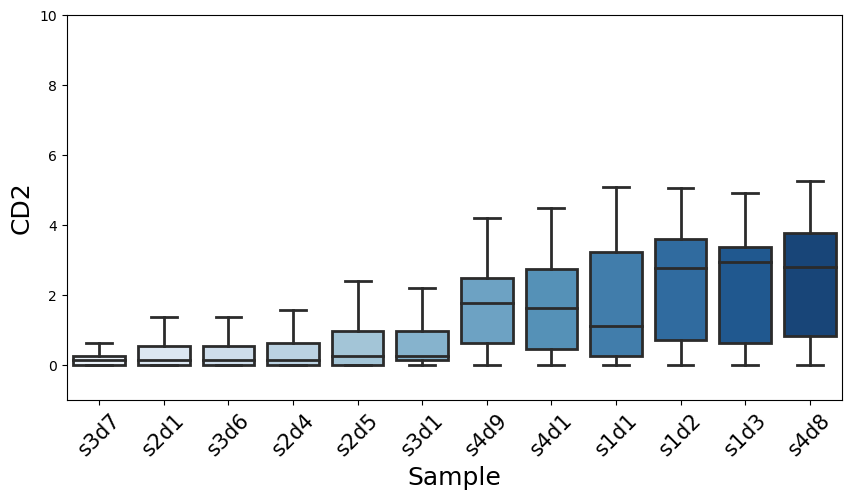

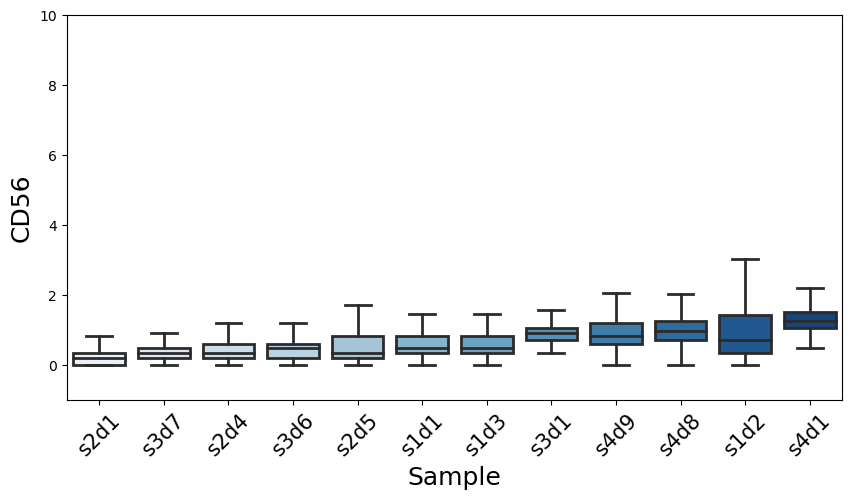

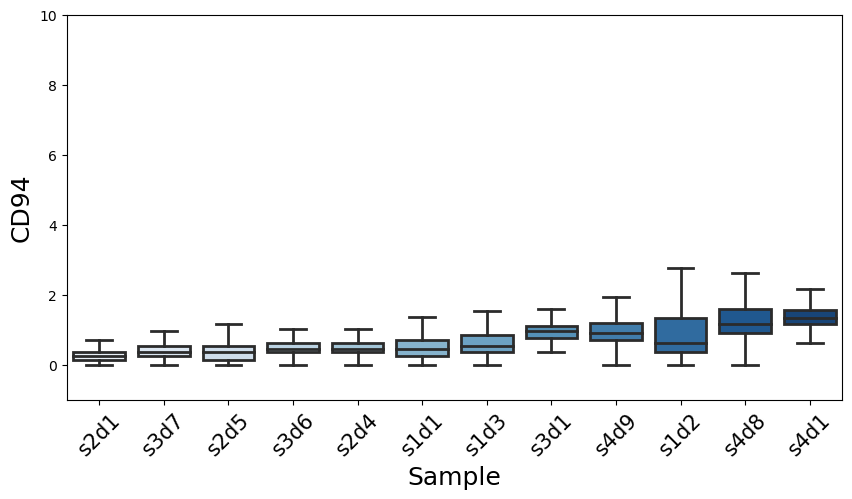

...

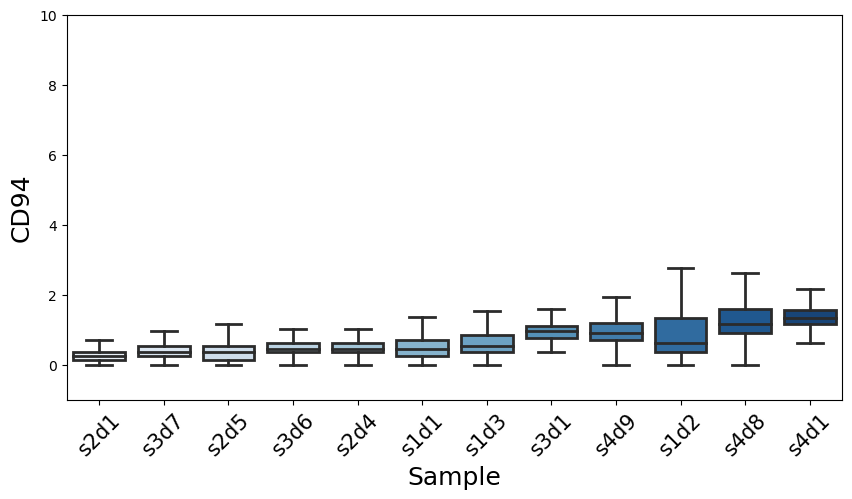

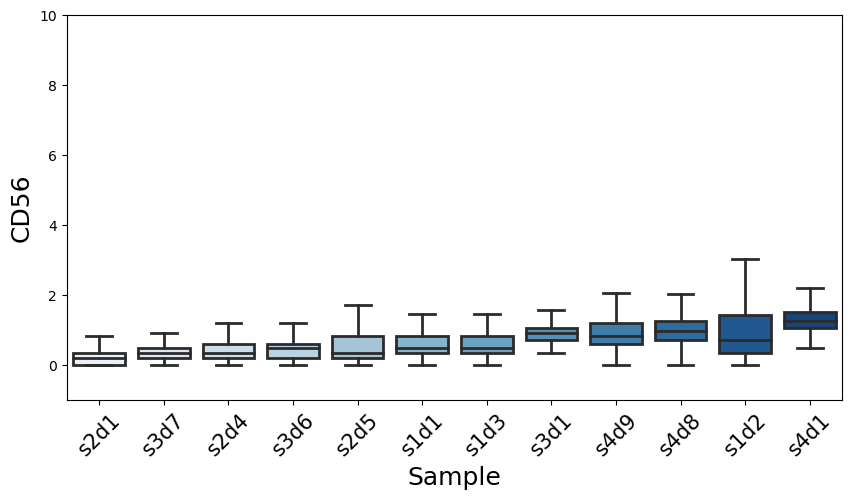

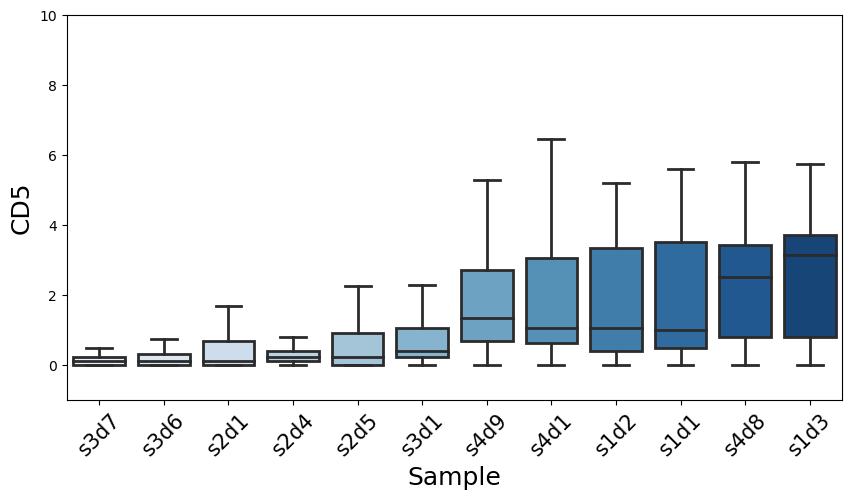

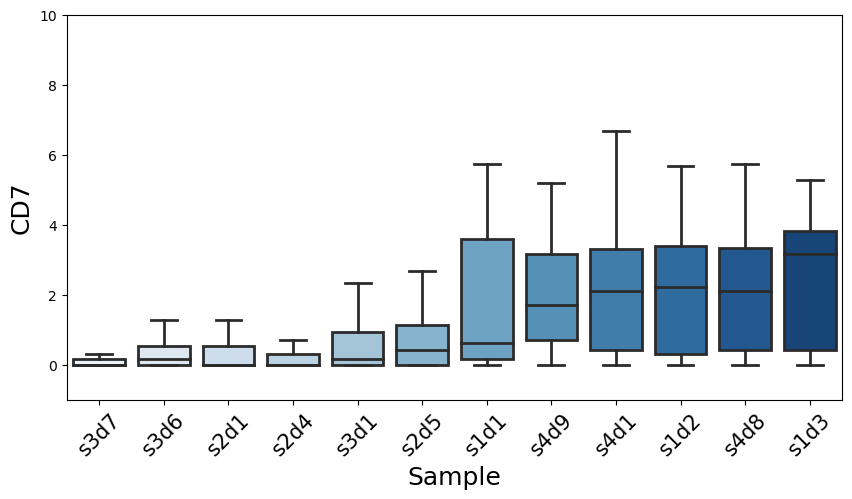

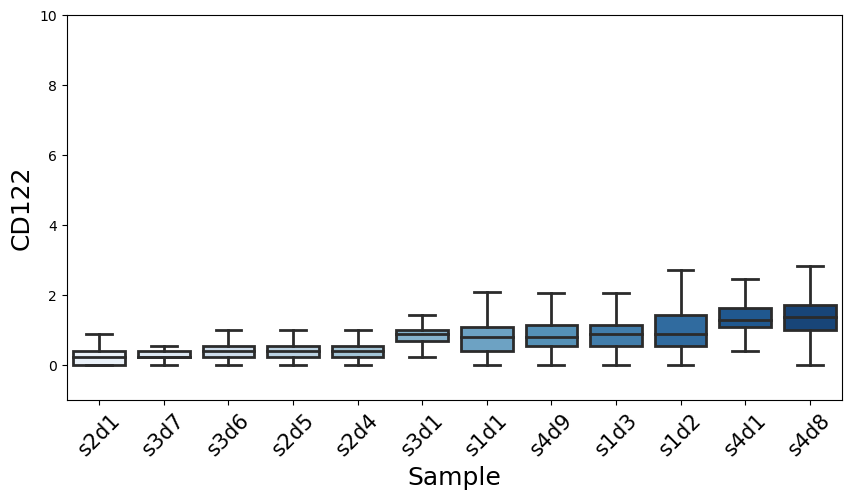

In [349]:
# All markers

for marker in nk_all:
    plt.figure(figsize=[10,5])
    plt.ylim(-1, 10)
    by_counts = df_all.groupby(['Sample'])[marker].mean().sort_values(ascending=True)
    b=sns.boxplot(data=df_all,x="Sample", y=marker, order=by_counts.index, fliersize=0, palette="Blues", linewidth=2)
    b.set_xticklabels(b.get_xticklabels(),rotation=45) 
    b.tick_params(axis='x', labelsize=15)
    plt.xlabel('Sample', fontsize=18)
    plt.ylabel(marker, fontsize=18);

In [350]:
data= df_sorted[['s4d1', 's4d9', 's4d8']]
data2 = df_sorted[['s3d6', 's3d1', 's3d7']]
data3 = df_sorted[['s1d2', 's1d1', 's1d3']]
data4 = df_sorted[['s2d1', 's2d5', 's2d4']]

In [351]:
data= data.T
data2 = data2.T
data3 = data3.T
data4 = data4.T

In [352]:
data= data[nk_all]
data2 = data2[nk_all]
data3 = data3[nk_all]
data4 = data4[nk_all]

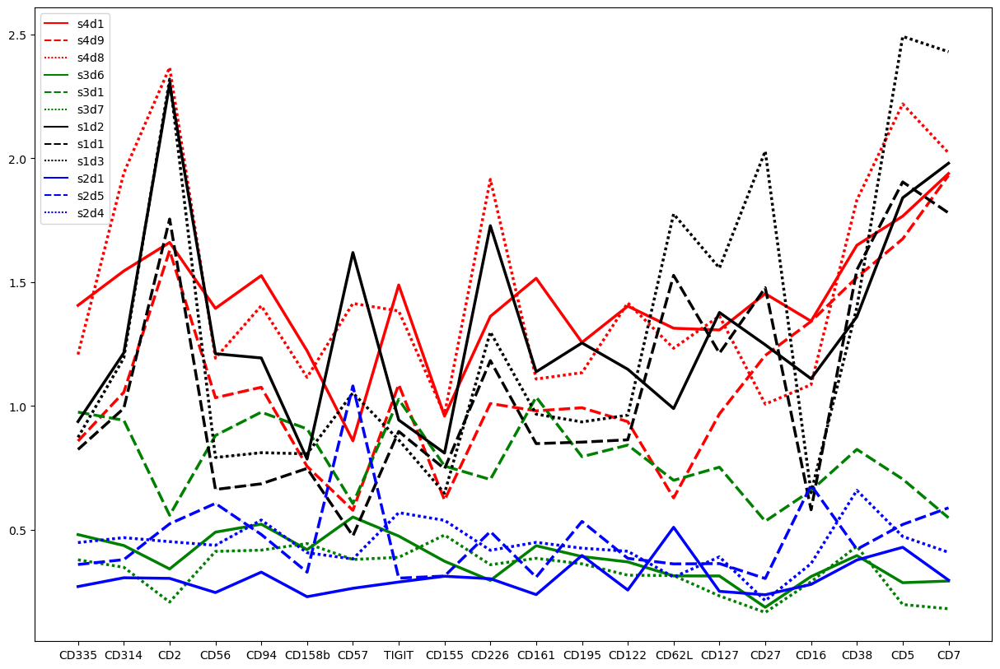

In [354]:
plt.figure(figsize=[15,10])

sns_plot = sns.lineplot(data=data.T, palette=['red'], linewidth=2.5)
sns_plot = sns.lineplot(data=data2.T, palette=['green'], linewidth=2.5)
sns_plot = sns.lineplot(data=data3.T,palette=['black'],linewidth=2.5)
sns_plot = sns.lineplot(data=data4.T,palette=['blue'],linewidth=2.5)

### Granja

In [355]:
samples_g=adata_granja.obs['POOL'].unique().tolist()
samples_g

['GSM4138872', 'GSM4138873', 'GSM4138874', 'GSM4138880', 'GSM4138885']

In [356]:
#save means of protein counts/each protein/each sample into a list

list_samples_g= []

for sample in samples_g:
    eg=adata_granja[adata_granja.obs['new_cell_type'] == 'NK']
    eg=adata_granja[adata_granja.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression_clr_granja']
    prot_mean=prot.mean(axis=0).sort_values()
    list_samples_g.append(prot_mean)

In [357]:
list_samples_g

[CD86      0.000000
 CD71      0.000000
 CD22      0.000000
 CD45      0.000000
 CD38      0.000000
             ...   
 CD127     1.998479
 CD15      2.009149
 CD45RO    2.271810
 CD3       2.338250
 CD4       2.476718
 Length: 141, dtype: float64,
 CD86      0.000000
 CD71      0.000000
 CD22      0.000000
 CD45      0.000000
 CD38      0.000000
             ...   
 CD127     2.133368
 CD15      2.154709
 CD45RO    2.376299
 CD3       2.458645
 CD4       2.554184
 Length: 141, dtype: float64,
 CD86     0.000000
 CD45     0.000000
 CD127    0.000000
 CD38     0.000000
 CD28     0.000000
            ...   
 CD7      0.961817
 CD90     1.433383
 CD10     1.742136
 CD123    2.052254
 CD34     3.957347
 Length: 141, dtype: float64,
 CD86     0.000000
 CD45     0.000000
 CD127    0.000000
 CD38     0.000000
 CD28     0.000000
            ...   
 CD90     1.124592
 CD123    2.787030
 CD7      3.082204
 CD33     3.625896
 CD34     4.028166
 Length: 141, dtype: float64,
 CD86     0.000000
 CD

In [358]:
all_cells_granja=[]
nk_cell_granja=[]

for sample in samples_g:
    all_cells_granja.append(len(adata_granja[adata_granja.obs['POOL'] == sample]))
    nk_cell_granja.append(len(granja_nk[granja_nk.obs['POOL'] == sample]))

print(all_cells_granja)
print(nk_cell_granja)

[6194, 6247, 1856, 5812, 4095]
[517, 516, 0, 0, 0]


In [520]:
#save column names
proteins=adata_granja.obsm['protein_expression_clr_granja'].columns

In [360]:
#creating a dataframe from list of lists

df_g= pd.DataFrame(list_samples_g, columns = proteins)

df_g

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,2.009149,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,2.154709,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,3.957347,1.742136,1.433383,0.000000,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4.028166,0.907976,1.124592,0.000000,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.792122,0.039939,0.033877,0.000000,0.0,0.0


In [361]:
df_g=df_g.T

df_g

,0,1,2,3,4
CD86,0.000000,0.000000,0.000000,0.000000,0.000000
CD274,0.000000,0.000000,0.000000,0.000000,0.000000
CD270,0.000000,0.000000,0.000000,0.000000,0.000000
CD155,0.000000,0.000000,0.000000,0.000000,0.000000
CD112,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...
CD10,0.000000,0.000000,1.742136,0.907976,0.039939
CD90,0.000000,0.000000,1.433383,1.124592,0.033877
CD15,2.009149,2.154709,0.000000,0.000000,0.000000
CD117,0.000000,0.000000,0.000000,0.000000,0.000000


In [362]:
#add column names

df_g.columns=samples_g

df_g

,GSM4138872,GSM4138873,GSM4138874,GSM4138880,GSM4138885
CD86,0.000000,0.000000,0.000000,0.000000,0.000000
CD274,0.000000,0.000000,0.000000,0.000000,0.000000
CD270,0.000000,0.000000,0.000000,0.000000,0.000000
CD155,0.000000,0.000000,0.000000,0.000000,0.000000
CD112,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...
CD10,0.000000,0.000000,1.742136,0.907976,0.039939
CD90,0.000000,0.000000,1.433383,1.124592,0.033877
CD15,2.009149,2.154709,0.000000,0.000000,0.000000
CD117,0.000000,0.000000,0.000000,0.000000,0.000000


In [363]:
df_g=df_g.T

df_g

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
GSM4138872,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,2.009149,0.0,0.0
GSM4138873,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,2.154709,0.0,0.0
GSM4138874,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,3.957347,1.742136,1.433383,0.000000,0.0,0.0
GSM4138880,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4.028166,0.907976,1.124592,0.000000,0.0,0.0
GSM4138885,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.792122,0.039939,0.033877,0.000000,0.0,0.0


In [364]:
#remove columns that contain only zeros

df_g = pd.DataFrame(df_g)
df_g != 0
(df_g != 0).any(axis=0)
df_g.loc[:, (df_g != 0).any(axis=0)]
df_g = df_g.loc[:, (df_g != 0).any(axis=0)]

df_g

,CD3,CD8,CD56,CD19,CD33,CD45RA,CD123,CD7,CD4,CD14,CD16,CD25,CD45RO,CD279,TIGIT,CD127,CD34,CD10,CD90,CD15
GSM4138872,2.338250,1.600122,1.557328,1.138823,0.000000,1.506254,0.000000,0.000000,2.476718,1.886085,1.482725,1.715793,2.271810,1.645894,1.265601,1.998479,0.000000,0.000000,0.000000,2.009149
GSM4138873,2.458645,1.747759,1.717154,1.254067,0.000000,1.622308,0.000000,0.000000,2.554184,1.991724,1.633930,1.877548,2.376299,1.815823,1.402273,2.133368,0.000000,0.000000,0.000000,2.154709
GSM4138874,0.531317,0.876031,0.000000,0.754014,0.928664,0.891411,2.052254,0.961817,0.503113,0.087274,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.957347,1.742136,1.433383,0.000000
GSM4138880,0.162666,0.297205,0.000000,0.529258,3.625896,0.892540,2.787030,3.082204,0.240746,0.226270,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.028166,0.907976,1.124592,0.000000
GSM4138885,0.062129,0.223176,0.000000,0.017529,0.058753,0.059387,0.144306,0.447788,0.014363,0.011476,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.792122,0.039939,0.033877,0.000000


In [365]:
index_sort = df_g.mean().sort_values().index
df_sorted_g = df_g[index_sort]

df_sorted_g

,CD90,TIGIT,CD10,CD16,CD56,CD279,CD25,CD19,CD127,CD15,CD14,CD7,CD33,CD45RO,CD8,CD45RA,CD123,CD3,CD4,CD34
GSM4138872,0.000000,1.265601,0.000000,1.482725,1.557328,1.645894,1.715793,1.138823,1.998479,2.009149,1.886085,0.000000,0.000000,2.271810,1.600122,1.506254,0.000000,2.338250,2.476718,0.000000
GSM4138873,0.000000,1.402273,0.000000,1.633930,1.717154,1.815823,1.877548,1.254067,2.133368,2.154709,1.991724,0.000000,0.000000,2.376299,1.747759,1.622308,0.000000,2.458645,2.554184,0.000000
GSM4138874,1.433383,0.000000,1.742136,0.000000,0.000000,0.000000,0.000000,0.754014,0.000000,0.000000,0.087274,0.961817,0.928664,0.000000,0.876031,0.891411,2.052254,0.531317,0.503113,3.957347
GSM4138880,1.124592,0.000000,0.907976,0.000000,0.000000,0.000000,0.000000,0.529258,0.000000,0.000000,0.226270,3.082204,3.625896,0.000000,0.297205,0.892540,2.787030,0.162666,0.240746,4.028166
GSM4138885,0.033877,0.000000,0.039939,0.000000,0.000000,0.000000,0.000000,0.017529,0.000000,0.000000,0.011476,0.447788,0.058753,0.000000,0.223176,0.059387,0.144306,0.062129,0.014363,0.792122


In [366]:
df_sorted_g=df_sorted_g.T

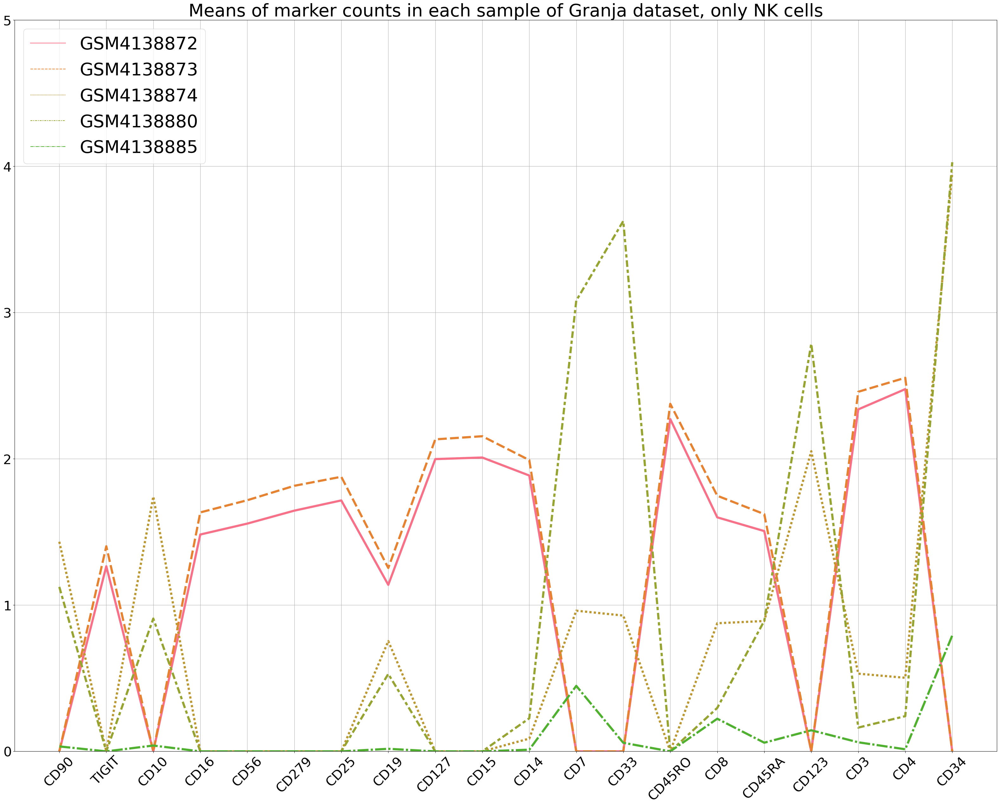

In [533]:
#Only NK cells from each sample selected, CLR normalized

palette = sns.color_palette("husl", 12)


plt.figure(figsize=[40,30])
a= sns.lineplot(data=df_sorted_g, palette=palette, linewidth = 5)
a.set_xticklabels(a.get_xticklabels(),rotation=45) 
a.tick_params(axis='x', labelsize=30)
a.tick_params(axis='y', labelsize=30)
plt.ylim(0, 5)
plt.legend(loc='upper left', fontsize = 40, facecolor='white')
plt.grid()
plt.title("Means of marker counts in each sample of Granja dataset, only NK cells", fontsize=40) ;




In [380]:
df_sorted_g=df_sorted_g.T

In [375]:
df_sorted_g.columns

Index(['CD90', 'TIGIT', 'CD10', 'CD16', 'CD56', 'CD279', 'CD25', 'CD19',
       'CD127', 'CD15', 'CD14', 'CD7', 'CD33', 'CD45RO', 'CD8', 'CD45RA',
       'CD123', 'CD3', 'CD4', 'CD34'],
      dtype='object')

In [376]:
#Used to check which markers were used in Granja

listOfmarkers= nk_all

nk_granja= []

for x in listOfmarkers:
    if x in df_sorted_g.columns:
        print(x, "Yes")
        nk_granja.append(x)
    else:
        print(x, "No") 
        
print(nk_granja)



CD335 No
CD314 No
CD2 No
CD56 Yes
CD94 No
CD158b No
CD57 No
TIGIT Yes
CD155 No
CD226 No
CD161 No
CD195 No
CD122 No
CD94 No
CD62L No
CD127 Yes
CD27 No
TIGIT Yes
CD16 Yes
CD38 No
CD161 No
CD94 No
CD56 Yes
CD5 No
CD7 Yes
CD122 No
['CD56', 'TIGIT', 'CD127', 'TIGIT', 'CD16', 'CD56', 'CD7']


In [379]:
df_sorted_g

,CD90,TIGIT,CD10,CD16,CD56,CD279,CD25,CD19,CD127,CD15,CD14,CD7,CD33,CD45RO,CD8,CD45RA,CD123,CD3,CD4,CD34
GSM4138872,0.000000,1.265601,0.000000,1.482725,1.557328,1.645894,1.715793,1.138823,1.998479,2.009149,1.886085,0.000000,0.000000,2.271810,1.600122,1.506254,0.000000,2.338250,2.476718,0.000000
GSM4138873,0.000000,1.402273,0.000000,1.633930,1.717154,1.815823,1.877548,1.254067,2.133368,2.154709,1.991724,0.000000,0.000000,2.376299,1.747759,1.622308,0.000000,2.458645,2.554184,0.000000
GSM4138874,1.433383,0.000000,1.742136,0.000000,0.000000,0.000000,0.000000,0.754014,0.000000,0.000000,0.087274,0.961817,0.928664,0.000000,0.876031,0.891411,2.052254,0.531317,0.503113,3.957347
GSM4138880,1.124592,0.000000,0.907976,0.000000,0.000000,0.000000,0.000000,0.529258,0.000000,0.000000,0.226270,3.082204,3.625896,0.000000,0.297205,0.892540,2.787030,0.162666,0.240746,4.028166
GSM4138885,0.033877,0.000000,0.039939,0.000000,0.000000,0.000000,0.000000,0.017529,0.000000,0.000000,0.011476,0.447788,0.058753,0.000000,0.223176,0.059387,0.144306,0.062129,0.014363,0.792122


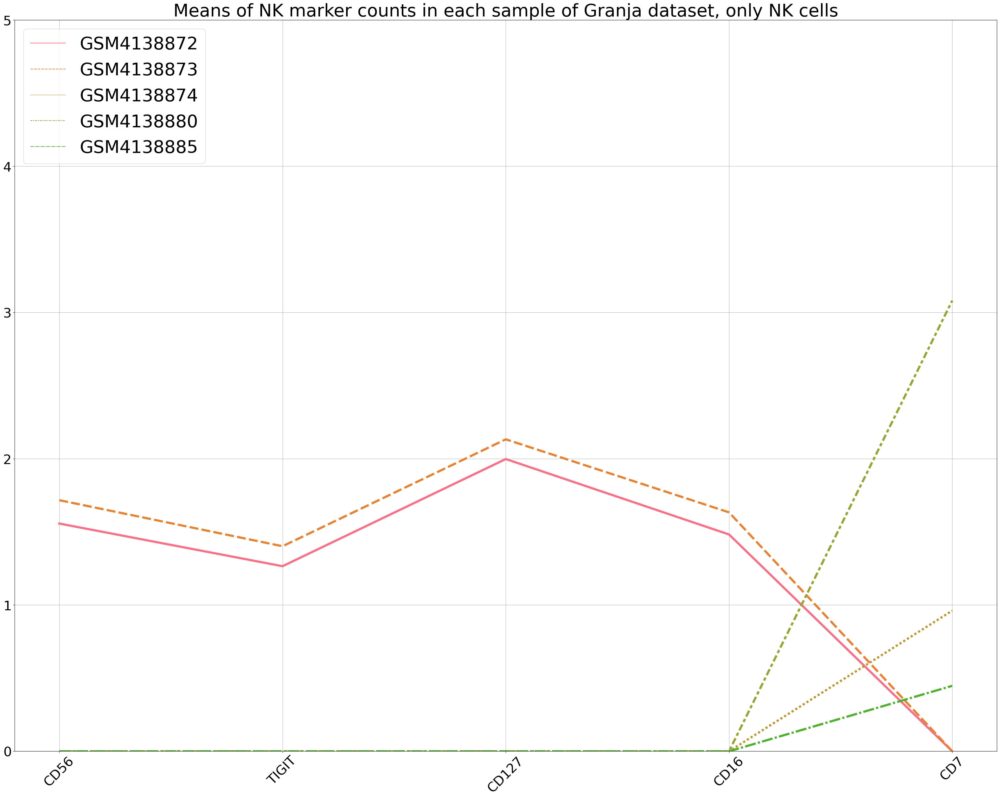

In [532]:
#Only NK cells from each sample selected, CLR normalized

palette = sns.color_palette("husl", 12)

plt.figure(figsize=[40,30])
a= sns.lineplot(data=df_sorted_g.loc[nk_granja], palette=palette, linewidth = 5)
a.set_xticklabels(a.get_xticklabels(),rotation=45) 
a.tick_params(axis='x', labelsize=30)
a.tick_params(axis='y', labelsize=30)
plt.ylim(0, 5)
plt.legend(loc='upper left', fontsize = 40, facecolor='white')
plt.grid()
plt.title("Means of NK marker counts in each sample of Granja dataset, only NK cells", fontsize=40) ;




In [519]:
#All cell types included

#save means of protein counts/each protein/each sample into a list

list_samples_g_all= []

for sample in samples_g:
    eg=adata_granja[adata_granja.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression_clr_granja']
    prot_mean=prot.mean(axis=0).sort_values()
    list_samples_g_all.append(prot_mean)

In [521]:
#creating a dataframe from list of lists

df_g_all= pd.DataFrame(list_samples_g_all, columns = proteins)

df_g_all

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,2.009149,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,2.154709,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,3.957347,1.742136,1.433383,0.000000,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4.028166,0.907976,1.124592,0.000000,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.792122,0.039939,0.033877,0.000000,0.0,0.0


In [522]:
df_g_all=df_g_all.T

df_g_all

,0,1,2,3,4
CD86,0.000000,0.000000,0.000000,0.000000,0.000000
CD274,0.000000,0.000000,0.000000,0.000000,0.000000
CD270,0.000000,0.000000,0.000000,0.000000,0.000000
CD155,0.000000,0.000000,0.000000,0.000000,0.000000
CD112,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...
CD10,0.000000,0.000000,1.742136,0.907976,0.039939
CD90,0.000000,0.000000,1.433383,1.124592,0.033877
CD15,2.009149,2.154709,0.000000,0.000000,0.000000
CD117,0.000000,0.000000,0.000000,0.000000,0.000000


In [523]:
#add column names

df_g_all.columns=samples_g

df_g_all

,GSM4138872,GSM4138873,GSM4138874,GSM4138880,GSM4138885
CD86,0.000000,0.000000,0.000000,0.000000,0.000000
CD274,0.000000,0.000000,0.000000,0.000000,0.000000
CD270,0.000000,0.000000,0.000000,0.000000,0.000000
CD155,0.000000,0.000000,0.000000,0.000000,0.000000
CD112,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...
CD10,0.000000,0.000000,1.742136,0.907976,0.039939
CD90,0.000000,0.000000,1.433383,1.124592,0.033877
CD15,2.009149,2.154709,0.000000,0.000000,0.000000
CD117,0.000000,0.000000,0.000000,0.000000,0.000000


In [524]:
df_g_all=df_g_all.T

In [525]:
#remove columns that contain only zeros

df_g_all = pd.DataFrame(df_g_all)
df_g_all != 0
(df_g_all != 0).any(axis=0)
df_g_all.loc[:, (df_g_all != 0).any(axis=0)]
df_g_all = df_g_all.loc[:, (df_g_all != 0).any(axis=0)]

df_g_all

,CD3,CD8,CD56,CD19,CD33,CD45RA,CD123,CD7,CD4,CD14,CD16,CD25,CD45RO,CD279,TIGIT,CD127,CD34,CD10,CD90,CD15
GSM4138872,2.338250,1.600122,1.557328,1.138823,0.000000,1.506254,0.000000,0.000000,2.476718,1.886085,1.482725,1.715793,2.271810,1.645894,1.265601,1.998479,0.000000,0.000000,0.000000,2.009149
GSM4138873,2.458645,1.747759,1.717154,1.254067,0.000000,1.622308,0.000000,0.000000,2.554184,1.991724,1.633930,1.877548,2.376299,1.815823,1.402273,2.133368,0.000000,0.000000,0.000000,2.154709
GSM4138874,0.531317,0.876031,0.000000,0.754014,0.928664,0.891411,2.052254,0.961817,0.503113,0.087274,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.957347,1.742136,1.433383,0.000000
GSM4138880,0.162666,0.297205,0.000000,0.529258,3.625896,0.892540,2.787030,3.082204,0.240746,0.226270,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.028166,0.907976,1.124592,0.000000
GSM4138885,0.062129,0.223176,0.000000,0.017529,0.058753,0.059387,0.144306,0.447788,0.014363,0.011476,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.792122,0.039939,0.033877,0.000000


In [526]:
df_g_all=df_g_all.T

In [527]:
index_sort = df_g_all.mean().sort_values().index
df_sorted_g_all = df_g_all[index_sort]

df_sorted_g_all

,GSM4138885,GSM4138874,GSM4138880,GSM4138872,GSM4138873
CD3,0.062129,0.531317,0.162666,2.338250,2.458645
CD8,0.223176,0.876031,0.297205,1.600122,1.747759
CD56,0.000000,0.000000,0.000000,1.557328,1.717154
CD19,0.017529,0.754014,0.529258,1.138823,1.254067
CD33,0.058753,0.928664,3.625896,0.000000,0.000000
CD45RA,0.059387,0.891411,0.892540,1.506254,1.622308
CD123,0.144306,2.052254,2.787030,0.000000,0.000000
CD7,0.447788,0.961817,3.082204,0.000000,0.000000
CD4,0.014363,0.503113,0.240746,2.476718,2.554184
CD14,0.011476,0.087274,0.226270,1.886085,1.991724


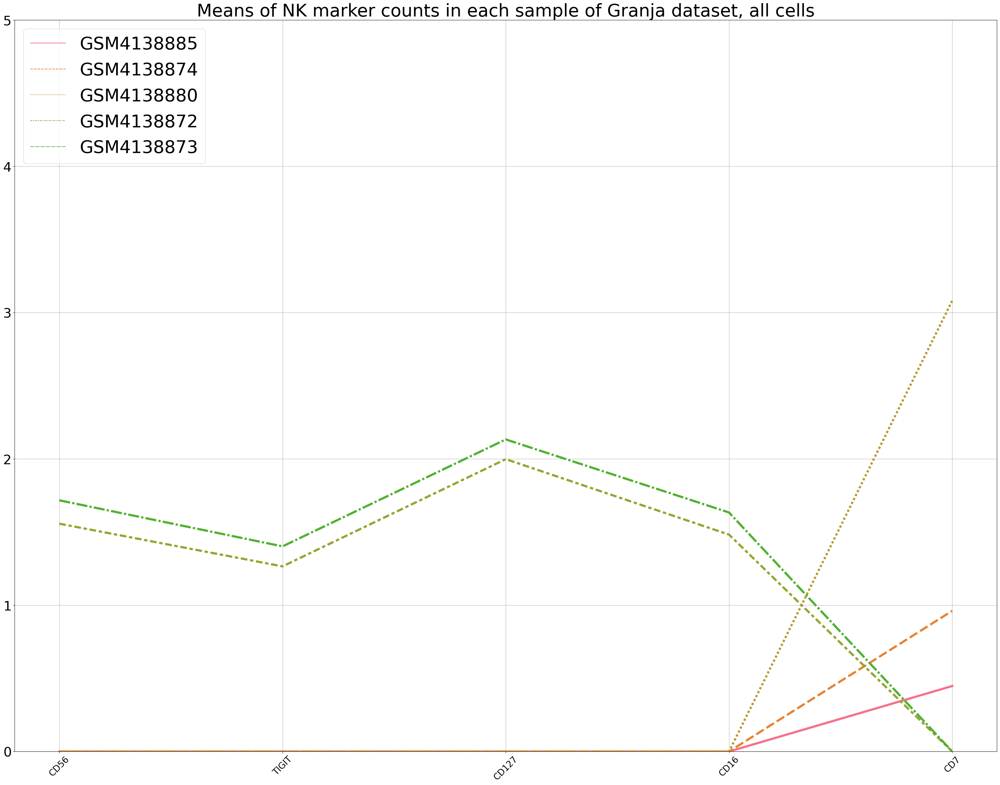

In [529]:
#Only NK cells from each sample selected, CLR normalized

palette = sns.color_palette("husl", 12)


plt.figure(figsize=[40,30])
a= sns.lineplot(data=df_sorted_g_all.loc[nk_granja], palette=palette, linewidth = 5)
a.set_xticklabels(a.get_xticklabels(),rotation=45) 
a.tick_params(axis='x', labelsize=20)
a.tick_params(axis='y', labelsize=30)
plt.ylim(0, 5)
plt.legend(loc='upper left', fontsize = 40, facecolor='white')
plt.grid()
plt.title("Means of NK marker counts in each sample of Granja dataset, all cells", fontsize=40) ;



### Easigenomics

In [383]:
samples_e=adata_easi.obs['POOL'].unique().tolist()
samples_e

['EG35',
 'EG38',
 'EG58',
 'EG39',
 'EG4',
 'EG48',
 'EG23',
 'EG36',
 'EG61',
 'EG3',
 'EG12',
 'EG46',
 'EG9',
 'EG43',
 'EG56',
 'EG42',
 'EG49',
 'EG37',
 'EG57',
 'EG24',
 'EG11',
 'EG14',
 'EG55',
 'EG28',
 'EG52',
 'EG33',
 'EG10',
 'EG32',
 'EG59',
 'EG16',
 'EG63',
 'EG15',
 'EG21',
 'EG26',
 'EG13',
 'EG53',
 'EG51',
 'EG2',
 'EG40',
 'EG62',
 'EG31',
 'EG7',
 'EG8',
 'EG29',
 'EG41',
 'EG47',
 'EG1',
 'EG6',
 'EG34',
 'EG30',
 'EG60',
 'EG44',
 'EG27',
 'EG22',
 'EG54',
 'EG45',
 'EG5',
 'EG50',
 'EG25']

In [384]:
#save means of protein counts/each protein/each sample into a list

list_samples_e= []

for sample in samples_e:
    eg=adata_easi[adata_easi.obs['new_cell_type'] == 'NKT']
    eg=adata_easi[adata_easi.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression_clr']
    prot_mean=prot.mean(axis=0).sort_values()
    list_samples_e.append(prot_mean)

In [385]:
list_samples_e

[CD13       0.265699
 CD24       0.340534
 CD117      0.353292
 CD127      0.411660
 CD73       0.414128
 CD64       0.416107
 CD19       0.448537
 CD3        0.494654
 CD10       0.517241
 CD38       0.539151
 CD197      0.566698
 CD58       0.569441
 CD45RO     0.577295
 CD33       0.579743
 CD45RA     0.616340
 CD56       0.618250
 CD123      0.647629
 CD66ace    0.667035
 CD14       0.669005
 CD20       0.694089
 CD34       0.723954
 CD5        0.739384
 CD8a       0.739866
 CD4        0.778748
 CD81       0.884947
 CD11b      0.910486
 CD7        0.982956
 CD11c      0.987901
 CD15       1.000074
 HLADR      1.138282
 CD45       1.581447
 CD2        1.606367
 CD44       2.578000
 dtype: float64,
 CD13       0.173746
 CD24       0.230233
 CD127      0.294504
 CD45RA     0.328251
 CD38       0.329450
 CD20       0.392649
 CD197      0.400206
 CD8a       0.420984
 CD5        0.431901
 CD7        0.436479
 CD33       0.457584
 CD45RO     0.465233
 CD64       0.468107
 CD14       0.496

In [386]:
all_cells_easi=[]
nkt_cell_easi=[]

for sample in samples_e:
    all_cells_easi.append(len(adata_easi[adata_easi.obs['POOL'] == sample]))
    nkt_cell_easi.append(len(easi_nkt[easi_nkt.obs['POOL'] == sample]))

print(all_cells_easi)
print(nkt_cell_easi)

[2188, 681, 3980, 5455, 1587, 1734, 35, 2169, 444, 131, 4864, 2064, 1107, 2435, 3763, 3123, 2111, 143, 1611, 1067, 480, 1756, 3736, 1304, 1670, 3199, 6262, 789, 2016, 2488, 1753, 584, 2394, 3125, 845, 2682, 2856, 1771, 2973, 572, 373, 709, 3020, 1323, 1735, 3523, 116, 2981, 1112, 2914, 1497, 2837, 837, 3663, 94, 3753, 1417, 2297, 3192]
[1226, 34, 1057, 538, 0, 57, 0, 1585, 23, 0, 1670, 1913, 26, 187, 809, 508, 131, 37, 887, 12, 51, 1004, 2483, 0, 636, 282, 3688, 142, 454, 1829, 40, 70, 39, 0, 263, 349, 150, 0, 602, 38, 0, 0, 0, 0, 541, 2508, 0, 0, 1011, 0, 0, 72, 0, 176, 49, 103, 0, 362, 96]


In [387]:
#save column names
proteins=adata_easi.obsm['protein_expression_clr'].columns

In [388]:
#creating a dataframe from list of lists

df_e= pd.DataFrame(list_samples_e, columns = proteins)

df_e

,CD19,CD10,CD20,CD3,CD2,CD11b,HLADR,CD38,CD11c,CD7,...,CD5,CD15,CD64,CD117,CD24,CD44,CD58,CD66ace,CD13,CD34
0,0.448537,0.517241,0.694089,0.494654,1.606367,0.910486,1.138282,0.539151,0.987901,0.982956,...,0.739384,1.000074,0.416107,0.353292,0.340534,2.578000,0.569441,0.667035,0.265699,0.723954
1,0.733674,1.089288,0.392649,0.833598,0.756523,0.651989,1.150177,0.329450,0.560880,0.436479,...,0.431901,1.115313,0.468107,1.642199,0.230233,2.138599,1.127362,0.534961,0.173746,1.249160
2,0.305262,0.482434,0.626202,0.248340,1.407541,1.584338,1.523780,0.679263,1.571974,0.821965,...,0.582078,0.806806,0.787143,0.242874,0.245265,3.236163,0.683364,0.441328,0.569654,0.537006
3,0.691737,0.986514,0.392102,0.791845,0.836717,0.612555,1.090049,0.360523,0.597207,0.552535,...,0.510782,1.078738,0.444188,1.139615,0.260386,2.553254,1.247979,0.518352,0.238786,0.936024
4,0.563074,0.995529,0.260906,0.496335,2.683623,1.342541,0.501954,1.271636,0.493910,3.469045,...,0.839155,1.024278,0.128840,1.157520,0.133427,2.327197,0.588197,0.193379,0.144667,1.029990
5,0.549411,0.717000,0.517116,0.343366,0.813547,1.179146,1.508922,0.761560,1.402230,0.488444,...,0.352358,0.959233,0.520424,0.872469,0.252657,3.369586,2.098770,0.469138,0.222388,1.053661
6,0.796607,3.005452,0.806256,0.746655,0.726841,1.026456,1.092794,0.434401,0.788130,0.380121,...,0.403047,0.822555,0.544582,0.337555,0.362959,2.165675,0.713014,0.510630,0.258271,1.341737
7,0.377700,0.564714,0.492597,0.578518,2.128343,0.814797,0.920698,0.555779,0.789727,1.272757,...,0.877955,1.127370,0.317815,0.370716,0.303417,2.732611,0.858651,0.482084,0.209763,0.679148
8,0.391122,0.522505,0.586464,0.287238,0.867662,0.915611,2.114939,0.510450,1.187394,0.378065,...,0.570426,0.713276,0.677318,0.717576,0.311081,3.610885,0.507943,0.383129,0.276934,1.056292
9,0.266180,0.998670,0.295110,0.716553,2.490606,1.209066,0.629620,0.460375,0.343037,1.977228,...,1.649061,1.091781,0.099069,0.471983,0.145988,3.494089,0.619612,0.209363,0.151304,0.598728


In [389]:
df_e=df_e.T

df_e

,0,1,2,3,4,5,6,7,8,9,...,49,50,51,52,53,54,55,56,57,58
CD19,0.448537,0.733674,0.305262,0.691737,0.563074,0.549411,0.796607,0.377700,0.391122,0.266180,...,0.596054,0.499037,0.300041,0.446439,1.563560,0.584201,0.326409,0.474832,0.689908,1.085722
CD10,0.517241,1.089288,0.482434,0.986514,0.995529,0.717000,3.005452,0.564714,0.522505,0.998670,...,0.828128,0.588941,0.509719,1.049332,3.988154,0.612560,0.431617,1.025210,0.468703,4.200456
CD20,0.694089,0.392649,0.626202,0.392102,0.260906,0.517116,0.806256,0.492597,0.586464,0.295110,...,0.784815,0.607292,0.411041,1.147475,0.392279,0.734175,0.473333,0.390626,0.537536,0.662600
CD3,0.494654,0.833598,0.248340,0.791845,0.496335,0.343366,0.746655,0.578518,0.287238,0.716553,...,0.347362,0.308735,0.192181,0.281080,0.213256,0.393189,0.214086,0.288328,0.296839,0.666851
CD2,1.606367,0.756523,1.407541,0.836717,2.683623,0.813547,0.726841,2.128343,0.867662,2.490606,...,0.838926,0.815296,1.347673,0.934005,0.785341,1.056324,0.917929,0.959303,1.086857,0.585191
CD11b,0.910486,0.651989,1.584338,0.612555,1.342541,1.179146,1.026456,0.814797,0.915611,1.209066,...,0.883467,1.253198,1.306381,1.078519,0.719273,0.870620,0.696750,1.141571,0.706403,0.651442
HLADR,1.138282,1.150177,1.523780,1.090049,0.501954,1.508922,1.092794,0.920698,2.114939,0.629620,...,1.005038,1.058227,1.910737,0.879925,1.360763,1.062953,1.710228,1.342749,2.626713,1.645191
CD38,0.539151,0.329450,0.679263,0.360523,1.271636,0.761560,0.434401,0.555779,0.510450,0.460375,...,0.892021,0.474534,0.697476,0.561513,0.423228,0.427984,0.663219,0.786110,0.681636,0.563054
CD11c,0.987901,0.560880,1.571974,0.597207,0.493910,1.402230,0.788130,0.789727,1.187394,0.343037,...,0.803545,0.958856,1.314410,0.534472,0.502771,0.838131,0.833999,0.551985,0.716856,0.460468
CD7,0.982956,0.436479,0.821965,0.552535,3.469045,0.488444,0.380121,1.272757,0.378065,1.977228,...,0.524332,0.386120,0.531747,2.024219,0.306446,0.724232,0.379871,0.471144,0.619367,0.411121


In [390]:
#add column names

df_e.columns=samples_e

df_e

,EG35,EG38,EG58,EG39,EG4,EG48,EG23,EG36,EG61,EG3,...,EG30,EG60,EG44,EG27,EG22,EG54,EG45,EG5,EG50,EG25
CD19,0.448537,0.733674,0.305262,0.691737,0.563074,0.549411,0.796607,0.377700,0.391122,0.266180,...,0.596054,0.499037,0.300041,0.446439,1.563560,0.584201,0.326409,0.474832,0.689908,1.085722
CD10,0.517241,1.089288,0.482434,0.986514,0.995529,0.717000,3.005452,0.564714,0.522505,0.998670,...,0.828128,0.588941,0.509719,1.049332,3.988154,0.612560,0.431617,1.025210,0.468703,4.200456
CD20,0.694089,0.392649,0.626202,0.392102,0.260906,0.517116,0.806256,0.492597,0.586464,0.295110,...,0.784815,0.607292,0.411041,1.147475,0.392279,0.734175,0.473333,0.390626,0.537536,0.662600
CD3,0.494654,0.833598,0.248340,0.791845,0.496335,0.343366,0.746655,0.578518,0.287238,0.716553,...,0.347362,0.308735,0.192181,0.281080,0.213256,0.393189,0.214086,0.288328,0.296839,0.666851
CD2,1.606367,0.756523,1.407541,0.836717,2.683623,0.813547,0.726841,2.128343,0.867662,2.490606,...,0.838926,0.815296,1.347673,0.934005,0.785341,1.056324,0.917929,0.959303,1.086857,0.585191
CD11b,0.910486,0.651989,1.584338,0.612555,1.342541,1.179146,1.026456,0.814797,0.915611,1.209066,...,0.883467,1.253198,1.306381,1.078519,0.719273,0.870620,0.696750,1.141571,0.706403,0.651442
HLADR,1.138282,1.150177,1.523780,1.090049,0.501954,1.508922,1.092794,0.920698,2.114939,0.629620,...,1.005038,1.058227,1.910737,0.879925,1.360763,1.062953,1.710228,1.342749,2.626713,1.645191
CD38,0.539151,0.329450,0.679263,0.360523,1.271636,0.761560,0.434401,0.555779,0.510450,0.460375,...,0.892021,0.474534,0.697476,0.561513,0.423228,0.427984,0.663219,0.786110,0.681636,0.563054
CD11c,0.987901,0.560880,1.571974,0.597207,0.493910,1.402230,0.788130,0.789727,1.187394,0.343037,...,0.803545,0.958856,1.314410,0.534472,0.502771,0.838131,0.833999,0.551985,0.716856,0.460468
CD7,0.982956,0.436479,0.821965,0.552535,3.469045,0.488444,0.380121,1.272757,0.378065,1.977228,...,0.524332,0.386120,0.531747,2.024219,0.306446,0.724232,0.379871,0.471144,0.619367,0.411121


In [391]:
df_e=df_e.T

In [392]:
#remove columns that contain only zeros

df_e = pd.DataFrame(df_e)
df_e != 0
(df_e != 0).any(axis=0)
df_e.loc[:, (df_e != 0).any(axis=0)]
df_e = df_e.loc[:, (df_e != 0).any(axis=0)]

df_e

,CD19,CD10,CD20,CD3,CD2,CD11b,HLADR,CD38,CD11c,CD7,...,CD5,CD15,CD64,CD117,CD24,CD44,CD58,CD66ace,CD13,CD34
EG35,0.448537,0.517241,0.694089,0.494654,1.606367,0.910486,1.138282,0.539151,0.987901,0.982956,...,0.739384,1.000074,0.416107,0.353292,0.340534,2.578000,0.569441,0.667035,0.265699,0.723954
EG38,0.733674,1.089288,0.392649,0.833598,0.756523,0.651989,1.150177,0.329450,0.560880,0.436479,...,0.431901,1.115313,0.468107,1.642199,0.230233,2.138599,1.127362,0.534961,0.173746,1.249160
EG58,0.305262,0.482434,0.626202,0.248340,1.407541,1.584338,1.523780,0.679263,1.571974,0.821965,...,0.582078,0.806806,0.787143,0.242874,0.245265,3.236163,0.683364,0.441328,0.569654,0.537006
EG39,0.691737,0.986514,0.392102,0.791845,0.836717,0.612555,1.090049,0.360523,0.597207,0.552535,...,0.510782,1.078738,0.444188,1.139615,0.260386,2.553254,1.247979,0.518352,0.238786,0.936024
EG4,0.563074,0.995529,0.260906,0.496335,2.683623,1.342541,0.501954,1.271636,0.493910,3.469045,...,0.839155,1.024278,0.128840,1.157520,0.133427,2.327197,0.588197,0.193379,0.144667,1.029990
EG48,0.549411,0.717000,0.517116,0.343366,0.813547,1.179146,1.508922,0.761560,1.402230,0.488444,...,0.352358,0.959233,0.520424,0.872469,0.252657,3.369586,2.098770,0.469138,0.222388,1.053661
EG23,0.796607,3.005452,0.806256,0.746655,0.726841,1.026456,1.092794,0.434401,0.788130,0.380121,...,0.403047,0.822555,0.544582,0.337555,0.362959,2.165675,0.713014,0.510630,0.258271,1.341737
EG36,0.377700,0.564714,0.492597,0.578518,2.128343,0.814797,0.920698,0.555779,0.789727,1.272757,...,0.877955,1.127370,0.317815,0.370716,0.303417,2.732611,0.858651,0.482084,0.209763,0.679148
EG61,0.391122,0.522505,0.586464,0.287238,0.867662,0.915611,2.114939,0.510450,1.187394,0.378065,...,0.570426,0.713276,0.677318,0.717576,0.311081,3.610885,0.507943,0.383129,0.276934,1.056292
EG3,0.266180,0.998670,0.295110,0.716553,2.490606,1.209066,0.629620,0.460375,0.343037,1.977228,...,1.649061,1.091781,0.099069,0.471983,0.145988,3.494089,0.619612,0.209363,0.151304,0.598728


In [393]:
index_sort = df_e.mean().sort_values().index
df_sorted_e = df_e[index_sort]

df_sorted_e

,CD13,CD24,CD197,CD3,CD66ace,CD64,CD127,CD45RO,CD20,CD8a,...,CD15,CD81,CD7,CD34,CD11b,CD45,CD10,CD2,HLADR,CD44
EG35,0.265699,0.340534,0.566698,0.494654,0.667035,0.416107,0.411660,0.577295,0.694089,0.739866,...,1.000074,0.884947,0.982956,0.723954,0.910486,1.581447,0.517241,1.606367,1.138282,2.578000
EG38,0.173746,0.230233,0.400206,0.833598,0.534961,0.468107,0.294504,0.465233,0.392649,0.420984,...,1.115313,0.849688,0.436479,1.249160,0.651989,1.067457,1.089288,0.756523,1.150177,2.138599
EG58,0.569654,0.245265,0.300790,0.248340,0.441328,0.787143,0.330374,0.478126,0.626202,0.495728,...,0.806806,0.657749,0.821965,0.537006,1.584338,1.690245,0.482434,1.407541,1.523780,3.236163
EG39,0.238786,0.260386,0.378870,0.791845,0.518352,0.444188,0.298505,0.471634,0.392102,0.429063,...,1.078738,0.718990,0.552535,0.936024,0.612555,1.009070,0.986514,0.836717,1.090049,2.553254
EG4,0.144667,0.133427,0.217810,0.496335,0.193379,0.128840,0.472099,0.294266,0.260906,0.334275,...,1.024278,0.885145,3.469045,1.029990,1.342541,1.261513,0.995529,2.683623,0.501954,2.327197
EG48,0.222388,0.252657,0.359882,0.343366,0.469138,0.520424,0.339053,0.552821,0.517116,0.307097,...,0.959233,0.682107,0.488444,1.053661,1.179146,1.503869,0.717000,0.813547,1.508922,3.369586
EG23,0.258271,0.362959,0.327366,0.746655,0.510630,0.544582,0.341351,0.439561,0.806256,0.704664,...,0.822555,0.692601,0.380121,1.341737,1.026456,1.006317,3.005452,0.726841,1.092794,2.165675
EG36,0.209763,0.303417,0.420495,0.578518,0.482084,0.317815,0.396162,0.616137,0.492597,1.242791,...,1.127370,0.968735,1.272757,0.679148,0.814797,1.735112,0.564714,2.128343,0.920698,2.732611
EG61,0.276934,0.311081,0.409461,0.287238,0.383129,0.677318,0.404612,0.531778,0.586464,0.436106,...,0.713276,0.915680,0.378065,1.056292,0.915611,1.248019,0.522505,0.867662,2.114939,3.610885
EG3,0.151304,0.145988,0.298769,0.716553,0.209363,0.099069,0.590999,0.473174,0.295110,0.827672,...,1.091781,1.097668,1.977228,0.598728,1.209066,2.072622,0.998670,2.490606,0.629620,3.494089


In [394]:
df_sorted_e=df_sorted_e.T

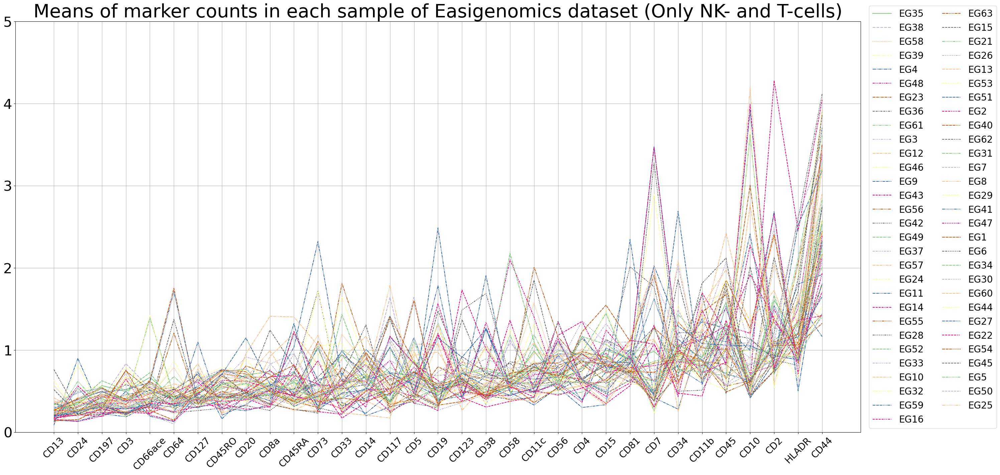

In [395]:
#only NK- and T-cells selected from each sample, CLR normalized

palette = sns.color_palette("Accent")

plt.figure(figsize=[30,15])
ax = sns.lineplot(data=df_sorted_e, palette=palette)
ax.legend(loc=(1.01, 0.01), ncol=2, fontsize = 20, facecolor='white')
ax.tick_params(axis='x', labelsize=20, rotation=45)
ax.tick_params(axis='y', labelsize=30)
plt.grid()
plt.ylim(0, 5)
plt.title("Means of marker counts in each sample of Easigenomics dataset (Only NK- and T-cells)", fontsize=40) ;

plt.tight_layout()

In [508]:
df_sorted_e=df_sorted_e.T

In [509]:
#Used to check which markers were used in Granja

listOfmarkers= nk_all

nk_easi= []

for x in listOfmarkers:
    if x in df_sorted_e.columns:
        print(x, "Yes")
        nk_easi.append(x)
    else:
        print(x, "No") 
        
print(nk_easi)



CD335 No
CD314 No
CD2 Yes
CD56 Yes
CD94 No
CD158b No
CD57 No
TIGIT No
CD155 No
CD226 No
CD161 No
CD195 No
CD122 No
CD94 No
CD62L No
CD127 Yes
CD27 No
TIGIT No
CD16 No
CD38 Yes
CD161 No
CD94 No
CD56 Yes
CD5 Yes
CD7 Yes
CD122 No
['CD2', 'CD56', 'CD127', 'CD38', 'CD56', 'CD5', 'CD7']


In [400]:
df_sorted_e=df_sorted_e.T

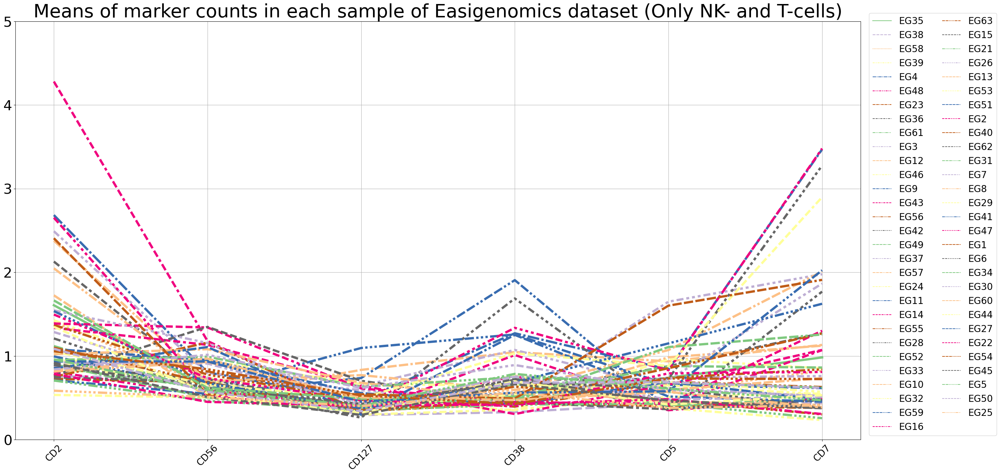

In [403]:
#only NK- and T-cells selected from each sample, CLR normalized

palette = sns.color_palette("Accent")

plt.figure(figsize=[30,15])
ax = sns.lineplot(data=df_sorted_e.loc[nk_easi], palette=palette, linewidth = 5)
ax.legend(loc=(1.01, 0.01), ncol=2, fontsize = 20, facecolor='white')
ax.tick_params(axis='x', labelsize=20, rotation=45)
ax.tick_params(axis='y', labelsize=30)
plt.grid()
plt.ylim(0, 5)
plt.title("Means of marker counts in each sample of Easigenomics dataset (Only NK- and T-cells)", fontsize=40) ;

plt.tight_layout()

In [456]:
samples_easi=adata_easi.obs['POOL'].unique().tolist()

In [493]:
#saving NK markers from all samples into a list

list_easi=[]

for sample in samples_easi:
    eg=adata_easi[adata_easi.obs['new_cell_type'] == 'NKT']
    eg=adata_easi[adata_easi.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression_clr']
    prot_marker=prot[nk_easi]
    list_easi.append(prot_marker)

In [494]:
samples_easi

['EG35',
 'EG38',
 'EG58',
 'EG39',
 'EG4',
 'EG48',
 'EG23',
 'EG36',
 'EG61',
 'EG3',
 'EG12',
 'EG46',
 'EG9',
 'EG43',
 'EG56',
 'EG42',
 'EG49',
 'EG37',
 'EG57',
 'EG24',
 'EG11',
 'EG14',
 'EG55',
 'EG28',
 'EG52',
 'EG33',
 'EG10',
 'EG32',
 'EG59',
 'EG16',
 'EG63',
 'EG15',
 'EG21',
 'EG26',
 'EG13',
 'EG53',
 'EG51',
 'EG2',
 'EG40',
 'EG62',
 'EG31',
 'EG7',
 'EG8',
 'EG29',
 'EG41',
 'EG47',
 'EG1',
 'EG6',
 'EG34',
 'EG30',
 'EG60',
 'EG44',
 'EG27',
 'EG22',
 'EG54',
 'EG45',
 'EG5',
 'EG50',
 'EG25']

In [495]:
list_easi

[                             CD2      CD56     CD127      CD38      CD56  \
 AAACCTGAGCCCTAAT-1-100  1.800515  0.664975  0.507486  0.386772  0.664975   
 AAACCTGCAAGCCGCT-1-100  1.530668  0.433851  0.457046  0.924628  0.433851   
 AAACCTGCACTGTCGG-1-100  0.938660  0.628908  0.439080  0.803020  0.628908   
 AAACCTGCAGACGCTC-1-100  1.879650  0.560815  0.223703  0.453003  0.560815   
 AAACCTGTCCTTAATC-1-100  1.853775  0.800025  0.422162  0.332136  0.800025   
 ...                          ...       ...       ...       ...       ...   
 TTTGGTTCACGCATCG-1-100  2.476960  0.910434  0.282215  0.502064  0.910434   
 TTTGGTTGTATAATGG-1-100  1.503584  0.480730  0.480730  0.437397  0.480730   
 TTTGGTTTCCGAAGAG-1-100  2.186110  0.332913  0.416453  0.416453  0.332913   
 TTTGTCAAGAATTGTG-1-100  1.607271  0.591293  0.411617  0.292300  0.591293   
 TTTGTCACATTCACTT-1-100  2.677990  0.774428  0.446620  0.230997  0.774428   
 
                              CD5       CD7  
 AAACCTGAGCCCTAAT-1-100  0.5

In [496]:
list_easi[1]

,CD2,CD56,CD127,CD38,CD56,CD5,CD7
AAACGGGGTCTAGCCG-1-101,0.707101,0.777017,0.199103,0.257540,0.777017,0.312750,0.592108
AAAGATGAGGGCTTCC-1-101,0.881300,0.881300,0.249051,0.172724,0.881300,0.319962,0.319962
AAAGATGCATGGGAAC-1-101,0.588557,0.495373,0.495373,1.672880,0.495373,0.278052,0.148659
AAAGCAACAGATAATG-1-101,0.840760,1.178216,0.382007,0.270140,1.178216,0.616756,0.382007
AAATGCCTCAAAGACA-1-101,0.908615,1.115291,0.205247,0.107880,1.115291,0.205247,0.293969
...,...,...,...,...,...,...,...
TTTCCTCTCCCTCAGT-1-101,0.539093,0.968136,0.342353,0.477715,0.968136,0.412323,0.267117
TTTCCTCTCGGCTACG-1-101,0.674346,0.624051,0.515171,0.091918,0.624051,0.515171,0.392970
TTTGCGCGTTAAGGGC-1-101,0.622673,0.724291,0.548697,0.286885,0.724291,0.509550,0.286885
TTTGCGCTCTGTCCGT-1-101,0.714835,0.872046,0.130309,0.442581,0.872046,0.486313,0.442581


In [497]:
pd.concat(list_easi, axis=0)

,CD2,CD56,CD127,CD38,CD56,CD5,CD7
AAACCTGAGCCCTAAT-1-100,1.800515,0.664975,0.507486,0.386772,0.664975,0.507486,1.667181
AAACCTGCAAGCCGCT-1-100,1.530668,0.433851,0.457046,0.924628,0.433851,0.625459,0.385782
AAACCTGCACTGTCGG-1-100,0.938660,0.628908,0.439080,0.803020,0.628908,0.611467,0.439080
AAACCTGCAGACGCTC-1-100,1.879650,0.560815,0.223703,0.453003,0.560815,1.135601,2.364060
AAACCTGTCCTTAATC-1-100,1.853775,0.800025,0.422162,0.332136,0.800025,1.088464,1.225956
...,...,...,...,...,...,...,...
TTTGTCAGTACATCCA-1-158,0.530098,0.673588,0.530098,0.945062,0.673588,0.299771,0.421551
TTTGTCAGTAGGCATG-1-158,0.775042,0.607699,0.460800,0.775042,0.607699,0.288542,0.154642
TTTGTCAGTATGCTTG-1-158,0.526422,0.712605,0.418479,0.669208,0.712605,0.473907,0.297459
TTTGTCATCAAACCAC-1-158,0.700772,0.184869,0.410555,0.265890,0.184869,0.410555,0.410555


In [498]:
# List of lists
# Retrieve protein expression of each sample
# Save it in df with sample information in one column
new_list=[]

for i in range(len(list_easi)):
    sample= list_easi[i]
    sample["Sample"]=samples_easi[i]
    new_list.append(sample)
    

In [503]:
df_new=pd.concat(new_list, axis=0)

In [504]:
df_new


,CD2,CD56,CD127,CD38,CD56,CD5,CD7,Sample
AAACCTGAGCCCTAAT-1-100,1.800515,0.664975,0.507486,0.386772,0.664975,0.507486,1.667181,EG35
AAACCTGCAAGCCGCT-1-100,1.530668,0.433851,0.457046,0.924628,0.433851,0.625459,0.385782,EG35
AAACCTGCACTGTCGG-1-100,0.938660,0.628908,0.439080,0.803020,0.628908,0.611467,0.439080,EG35
AAACCTGCAGACGCTC-1-100,1.879650,0.560815,0.223703,0.453003,0.560815,1.135601,2.364060,EG35
AAACCTGTCCTTAATC-1-100,1.853775,0.800025,0.422162,0.332136,0.800025,1.088464,1.225956,EG35
...,...,...,...,...,...,...,...,...
TTTGTCAGTACATCCA-1-158,0.530098,0.673588,0.530098,0.945062,0.673588,0.299771,0.421551,EG25
TTTGTCAGTAGGCATG-1-158,0.775042,0.607699,0.460800,0.775042,0.607699,0.288542,0.154642,EG25
TTTGTCAGTATGCTTG-1-158,0.526422,0.712605,0.418479,0.669208,0.712605,0.473907,0.297459,EG25
TTTGTCATCAAACCAC-1-158,0.700772,0.184869,0.410555,0.265890,0.184869,0.410555,0.410555,EG25


In [510]:
nk_easi = ['CD2', 'CD56', 'CD127', 'CD38', 'CD5', 'CD7']

In [514]:
df_new = df_new.T.drop_duplicates().T

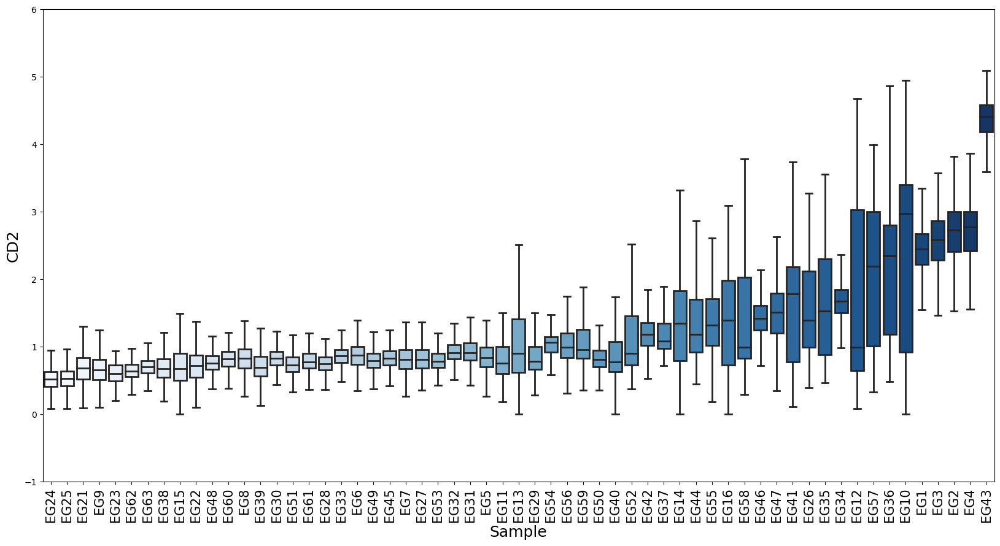

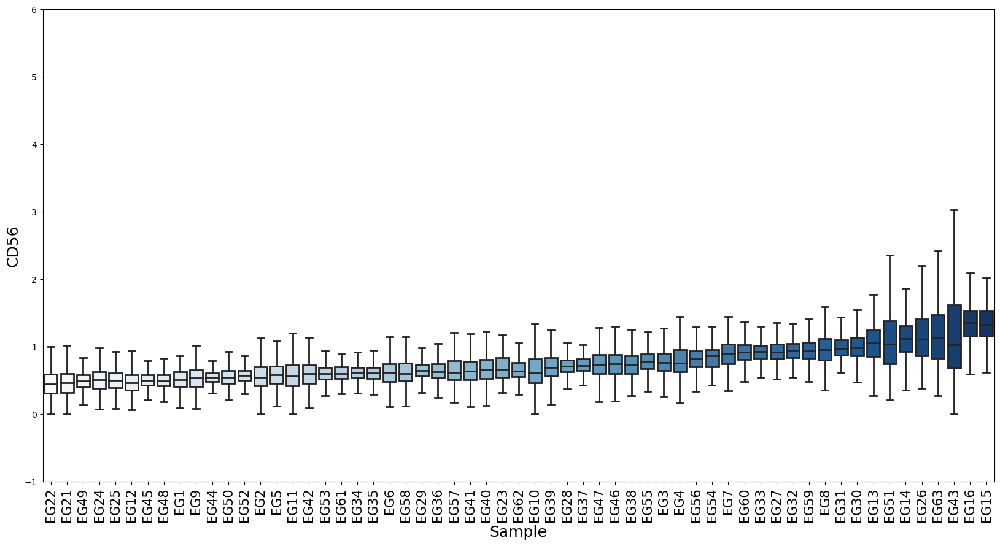

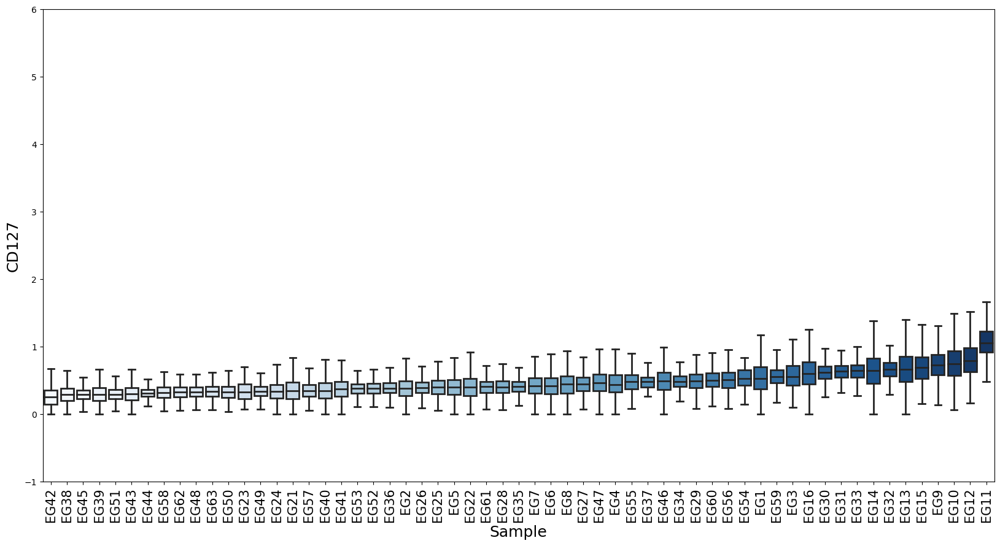

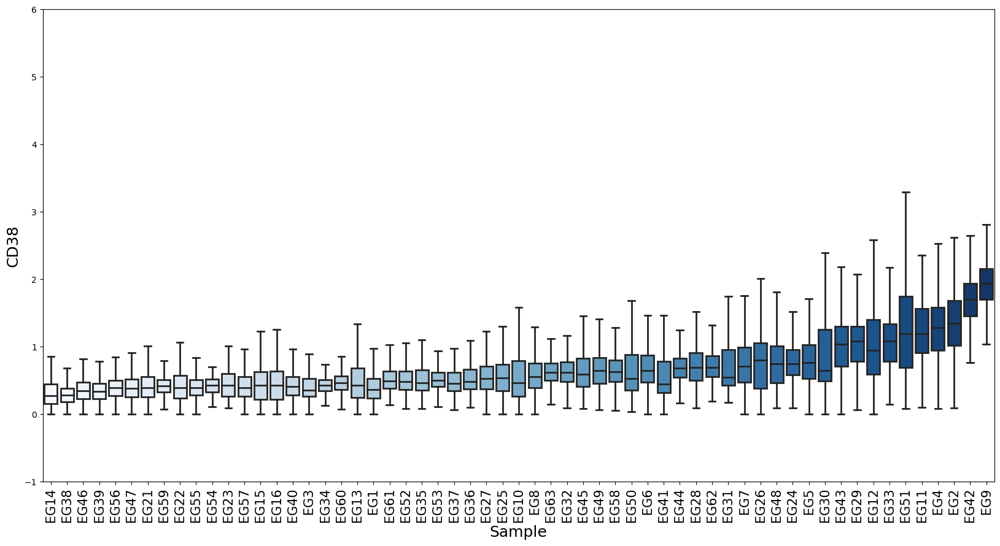

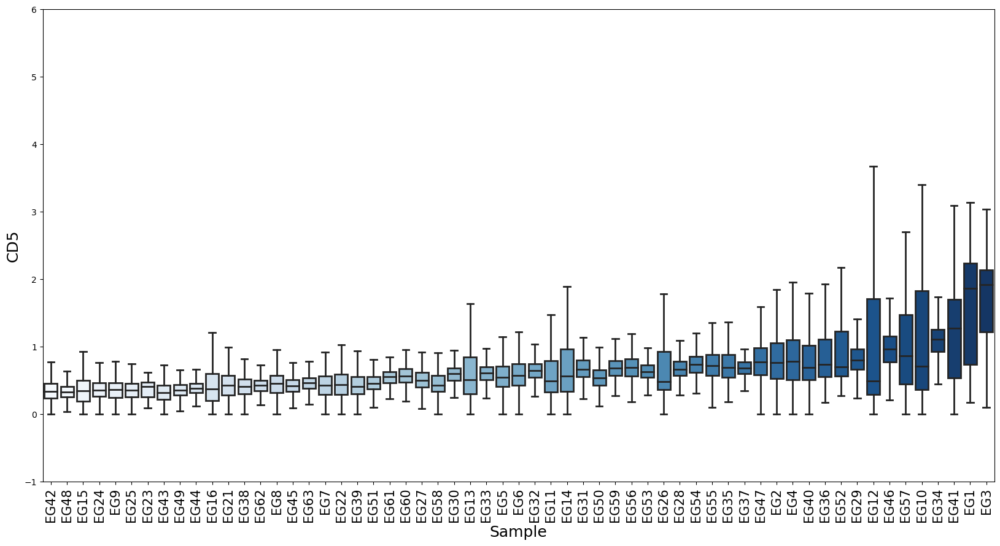

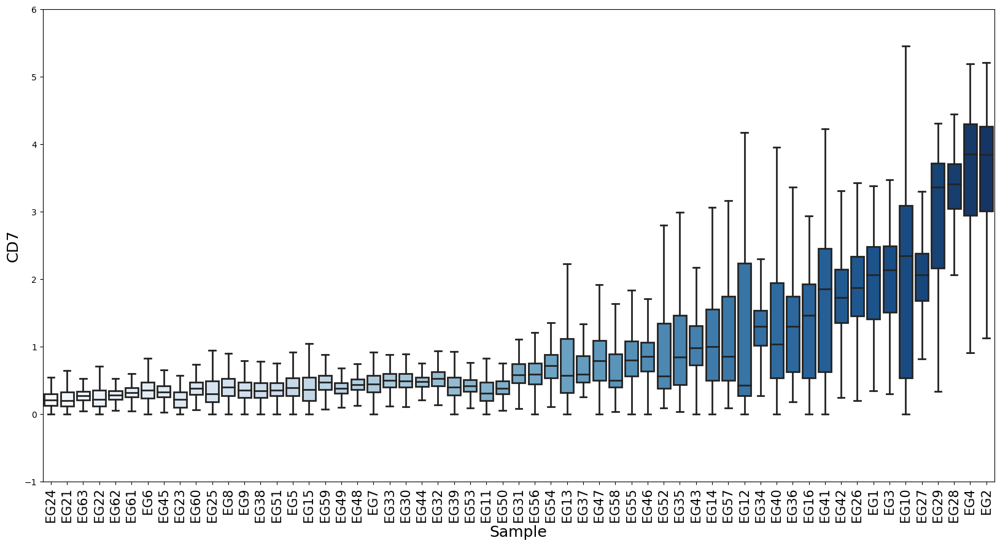

In [518]:
# All markers

for marker in nk_easi:
    plt.figure(figsize=[20,10])
    plt.ylim(-1, 6)
    by_counts = df_new.groupby(['Sample'])[marker].mean().sort_values(ascending=True)
    b=sns.boxplot(data=df_new,x="Sample", y=marker, order=by_counts.index, fliersize=0, palette="Blues", linewidth=2)
    b.set_xticklabels(b.get_xticklabels(),rotation=90) 
    b.tick_params(axis='x', labelsize=15)
    plt.xlabel('Sample', fontsize=18)
    plt.ylabel(marker, fontsize=18);

### Seurat

In [407]:
samples_s=adata_seurat.obs['POOL'].unique().tolist()
samples_s

['Seurat']

In [408]:
#save means of protein counts/each protein/each sample into a list

list_samples_s= []

for sample in samples_s:
    eg=adata_seurat[adata_seurat.obs['new_cell_type'] == 'NK']
    eg=adata_seurat[adata_seurat.obs['POOL'] == sample]
    prot=eg.obsm['protein_expression_clr_seurat']
    prot_mean=prot.mean(axis=0).sort_values()
    list_samples_s.append(prot_mean)

list_samples_s

[CD86     0.000000
 CD71     0.000000
 CD22     0.000000
 CD45     0.000000
 CD18     0.000000
            ...   
 CD11c    0.891831
 CD14     0.892399
 CD3      0.923868
 CD4      0.988902
 CD8      1.004051
 Length: 141, dtype: float64]

In [409]:
#save column names
proteins=adata_seurat.obsm['protein_expression_clr_seurat'].columns



In [410]:
all_cells_seurat=[]
nk_cell_seurat=[]

for sample in samples_s:
    all_cells_seurat.append(len(adata_seurat[adata_seurat.obs['POOL'] == sample]))
    nk_cell_seurat.append(len(seurat_nk[seurat_nk.obs['POOL'] == sample]))

print(all_cells_seurat)
print(nk_cell_seurat)

[29556]
[1355]


In [411]:
#creating a dataframe from list of lists

df_s= pd.DataFrame(list_samples_s, columns = proteins)

df_s


,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15,CD117,CD66ace
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.700643,0.742467,0.0,0.0,0.0,0.0,0.0


In [412]:
df_s=df_s.T

df_s


,0
CD86,0.0
CD274,0.0
CD270,0.0
CD155,0.0
CD112,0.0
...,...
CD10,0.0
CD90,0.0
CD15,0.0
CD117,0.0


In [413]:
#add column names

df_s.columns=samples_s

df_s


,Seurat
CD86,0.0
CD274,0.0
CD270,0.0
CD155,0.0
CD112,0.0
...,...
CD10,0.0
CD90,0.0
CD15,0.0
CD117,0.0


In [414]:
df_s=df_s.T

In [415]:
#remove columns that contain only zeros

df_s = pd.DataFrame(df_s)
df_s != 0
(df_s != 0).any(axis=0)
df_s.loc[:, (df_s != 0).any(axis=0)]
df_s = df_s.loc[:, (df_s != 0).any(axis=0)]

df_s

,CD3,CD8,CD56,CD19,CD11c,CD45RA,CD123,CD4,CD14,CD16,...,HLA-DR,CD57,CD278,CD11a,CD79b,CD28,CD38,CD127,CD197,CD34
Seurat,0.923868,1.004051,0.685785,0.823472,0.891831,0.851121,0.796022,0.988902,0.892399,0.776954,...,0.823718,0.715582,0.762652,0.793614,0.705012,0.784389,0.857191,0.830743,0.700643,0.742467


In [416]:
#sorting by mean

index_sort = df_s.mean().sort_values().index
df_sorted_s = df_s[index_sort]

df_sorted_s

,CD25,CD56,CD197,CD79b,CD57,CD161,CD34,CD278,CD16,CD69,...,HLA-DR,CD127,CD45RA,CD27,CD38,CD11c,CD14,CD3,CD4,CD8
Seurat,0.671071,0.685785,0.700643,0.705012,0.715582,0.739996,0.742467,0.762652,0.776954,0.784284,...,0.823718,0.830743,0.851121,0.855648,0.857191,0.891831,0.892399,0.923868,0.988902,1.004051


In [417]:
df_sorted_s=df_sorted_s.T

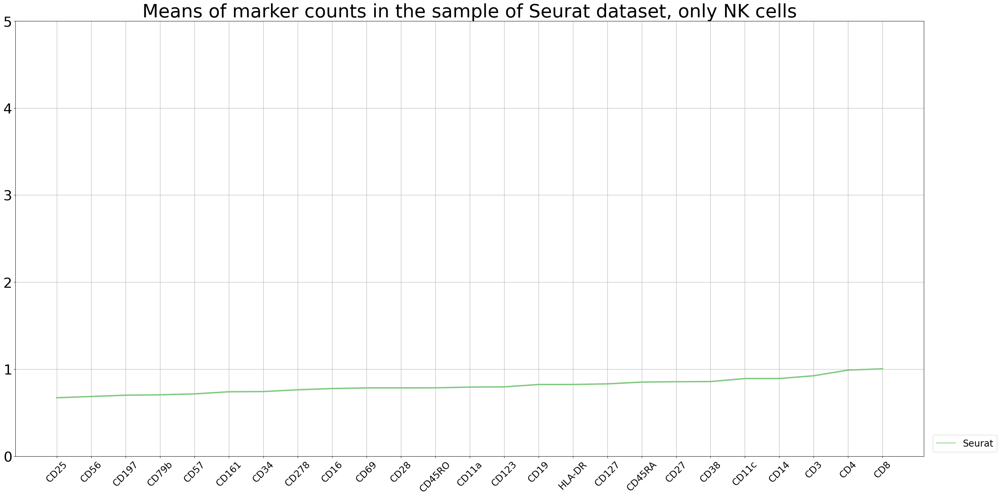

In [418]:
#only NK cells selected from each sample, CLR normalized

palette = sns.color_palette("Accent")

plt.figure(figsize=[30,15])
ax = sns.lineplot(data=df_sorted_s, palette=palette, linewidth = 3)
ax.legend(loc=(1.01, 0.01), ncol=2, fontsize = 20, facecolor='white')
ax.tick_params(axis='x', labelsize=20, rotation=45)
ax.tick_params(axis='y', labelsize=30)
plt.grid()
plt.ylim(0, 5)
plt.title("Means of marker counts in the sample of Seurat dataset, only NK cells", fontsize=40) ;

plt.tight_layout()


In [419]:
df_sorted_s=df_sorted_s.T

In [420]:
#Used to check which markers were used in Granja

listOfmarkers= nk_all

nk_seurat= []

for x in listOfmarkers:
    if x in df_sorted_s.columns:
        print(x, "Yes")
        nk_seurat.append(x)
    else:
        print(x, "No") 
        
print(nk_seurat)



CD335 No
CD314 No
CD2 No
CD56 Yes
CD94 No
CD158b No
CD57 Yes
TIGIT No
CD155 No
CD226 No
CD161 Yes
CD195 No
CD122 No
CD94 No
CD62L No
CD127 Yes
CD27 Yes
TIGIT No
CD16 Yes
CD38 Yes
CD161 Yes
CD94 No
CD56 Yes
CD5 No
CD7 No
CD122 No
['CD56', 'CD57', 'CD161', 'CD127', 'CD27', 'CD16', 'CD38', 'CD161', 'CD56']


In [422]:
df_sorted_s=df_sorted_s.T

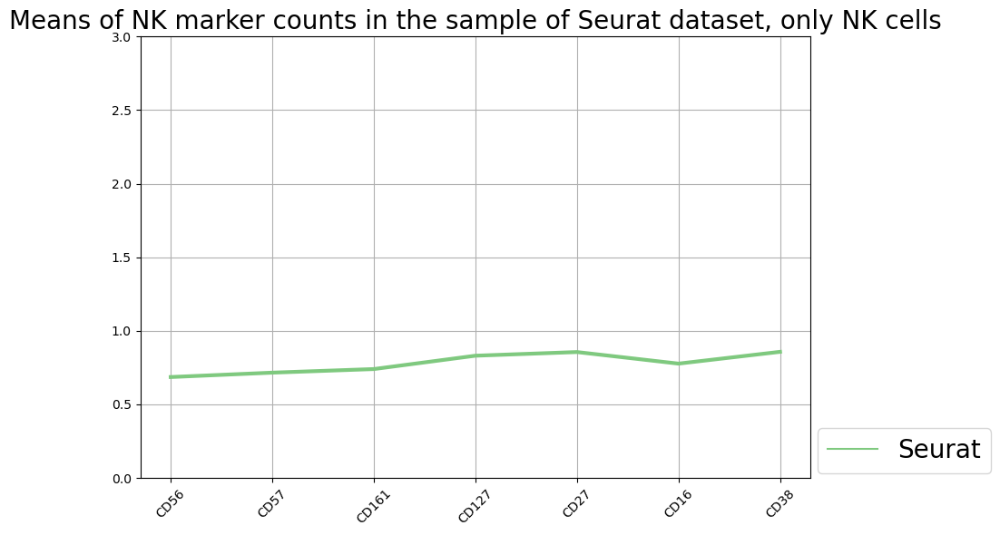

In [431]:
#only NK cells selected from each sample, CLR normalized

palette = sns.color_palette("Accent")

plt.figure(figsize=[10,6])
ax = sns.lineplot(data=df_sorted_s.loc[nk_seurat], palette=palette, linewidth = 3)
ax.legend(loc=(1.01, 0.01), ncol=2, fontsize = 20, facecolor='white')
ax.tick_params(axis='x', labelsize=10, rotation=45)
ax.tick_params(axis='y', labelsize=10)
plt.grid()
plt.ylim(0, 3)
plt.title("Means of NK marker counts in the sample of Seurat dataset, only NK cells", fontsize=20) ;

plt.tight_layout()

In [434]:
df_sorted_s

,Seurat
CD25,0.671071
CD56,0.685785
CD197,0.700643
CD79b,0.705012
CD57,0.715582
CD161,0.739996
CD34,0.742467
CD278,0.762652
CD16,0.776954
CD69,0.784284


In [ ]:
by_counts = df_all.groupby(['Sample'])[marker].mean().sort_values(ascending=True)

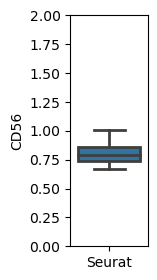

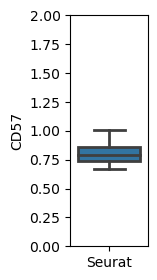

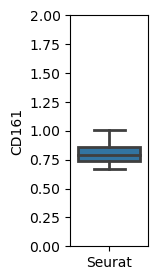

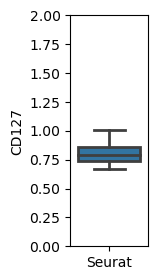

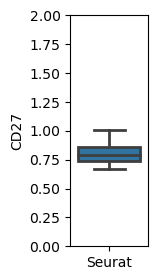

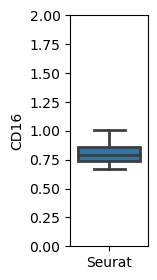

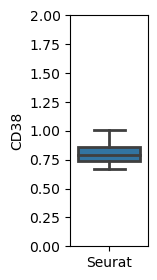

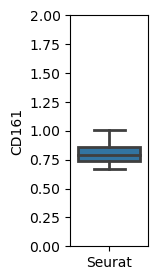

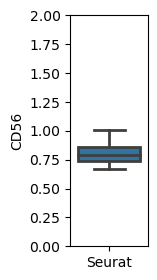

In [450]:
# All markers

for marker in nk_seurat:
    plt.figure(figsize=[1,3])
    plt.ylim(0, 2)
    ax=sns.boxplot(data=df_sorted_s, linewidth=2)
    ax.set_xticklabels(b.get_xticklabels()) 
    ax.tick_params(axis='x', labelsize=10)
    plt.ylabel(marker, fontsize=10);
    
    


## Number of cells per sample

In [78]:
df_easi_all= pd.DataFrame(all_cells_easi)
df_easi_all

,0
0,2188
1,681
2,3980
3,5455
4,1587
5,1734
6,35
7,2169
8,444
9,131


In [79]:
df_easi_all=df_easi_all.T

In [80]:
df_easi_all.columns=samples_e

In [81]:
df_easi_all

,EG35,EG38,EG58,EG39,EG4,EG48,EG23,EG36,EG61,EG3,...,EG30,EG60,EG44,EG27,EG22,EG54,EG45,EG5,EG50,EG25
0,2188,681,3980,5455,1587,1734,35,2169,444,131,...,2914,1497,2837,837,3663,94,3753,1417,2297,3192


In [82]:
df_easi_nkt= pd.DataFrame(nkt_cell_easi)

In [83]:
df_easi_nkt=df_easi_nkt.T

In [84]:
df_easi_nkt.columns=samples_e

In [85]:
df_easi_nkt

,EG35,EG38,EG58,EG39,EG4,EG48,EG23,EG36,EG61,EG3,...,EG30,EG60,EG44,EG27,EG22,EG54,EG45,EG5,EG50,EG25
0,1226,34,1057,538,0,57,0,1585,23,0,...,0,0,72,0,176,49,103,0,362,96


In [86]:
df_easi=pd.concat([df_easi_all, df_easi_nkt])

In [87]:
df_easi.index = ['All cells', 'NK cells']

In [88]:
df_easi

,EG35,EG38,EG58,EG39,EG4,EG48,EG23,EG36,EG61,EG3,...,EG30,EG60,EG44,EG27,EG22,EG54,EG45,EG5,EG50,EG25
All cells,2188,681,3980,5455,1587,1734,35,2169,444,131,...,2914,1497,2837,837,3663,94,3753,1417,2297,3192
NK cells,1226,34,1057,538,0,57,0,1585,23,0,...,0,0,72,0,176,49,103,0,362,96


In [89]:
df_easi=df_easi.T

In [90]:
df_easi

,All cells,NK cells
EG35,2188,1226
EG38,681,34
EG58,3980,1057
EG39,5455,538
EG4,1587,0
EG48,1734,57
EG23,35,0
EG36,2169,1585
EG61,444,23
EG3,131,0


In [91]:
df_easi["Sample"]=samples_e

In [92]:
df_easi

,All cells,NK cells,Sample
EG35,2188,1226,EG35
EG38,681,34,EG38
EG58,3980,1057,EG58
EG39,5455,538,EG39
EG4,1587,0,EG4
EG48,1734,57,EG48
EG23,35,0,EG23
EG36,2169,1585,EG36
EG61,444,23,EG61
EG3,131,0,EG3


[Text(0, 0, '2188'),
 Text(0, 0, '681'),
 Text(0, 0, '3980'),
 Text(0, 0, '5455'),
 Text(0, 0, '1587'),
 Text(0, 0, '1734'),
 Text(0, 0, '35'),
 Text(0, 0, '2169'),
 Text(0, 0, '444'),
 Text(0, 0, '131'),
 Text(0, 0, '4864'),
 Text(0, 0, '2064'),
 Text(0, 0, '1107'),
 Text(0, 0, '2435'),
 Text(0, 0, '3763'),
 Text(0, 0, '3123'),
 Text(0, 0, '2111'),
 Text(0, 0, '143'),
 Text(0, 0, '1611'),
 Text(0, 0, '1067'),
 Text(0, 0, '480'),
 Text(0, 0, '1756'),
 Text(0, 0, '3736'),
 Text(0, 0, '1304'),
 Text(0, 0, '1670'),
 Text(0, 0, '3199'),
 Text(0, 0, '6262'),
 Text(0, 0, '789'),
 Text(0, 0, '2016'),
 Text(0, 0, '2488'),
 Text(0, 0, '1753'),
 Text(0, 0, '584'),
 Text(0, 0, '2394'),
 Text(0, 0, '3125'),
 Text(0, 0, '845'),
 Text(0, 0, '2682'),
 Text(0, 0, '2856'),
 Text(0, 0, '1771'),
 Text(0, 0, '2973'),
 Text(0, 0, '572'),
 Text(0, 0, '373'),
 Text(0, 0, '709'),
 Text(0, 0, '3020'),
 Text(0, 0, '1323'),
 Text(0, 0, '1735'),
 Text(0, 0, '3523'),
 Text(0, 0, '116'),
 Text(0, 0, '2981'),
 Text(

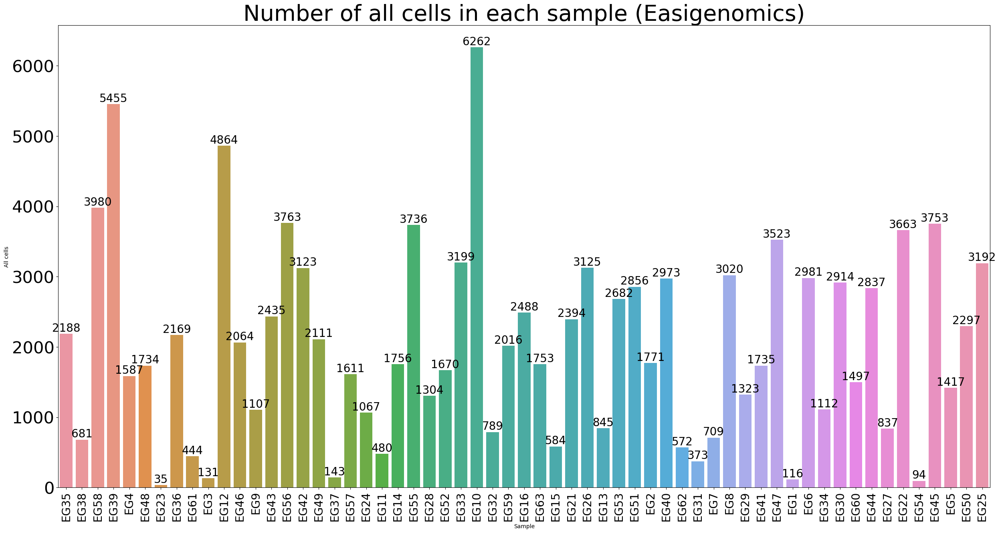

In [93]:
plt.figure(figsize=[30,15])

ax = sns.barplot(data=df_easi, x="Sample", y="All cells")
ax.tick_params(axis='x', labelsize=20, rotation=90)
plt.title("Number of all cells in each sample (Easigenomics)", fontsize=40) ;
ax.tick_params(axis='y', labelsize=30)
ax.bar_label(ax.containers[0],fontsize=20)



[Text(0, 0, '1226'),
 Text(0, 0, '34'),
 Text(0, 0, '1057'),
 Text(0, 0, '538'),
 Text(0, 0, '0'),
 Text(0, 0, '57'),
 Text(0, 0, '0'),
 Text(0, 0, '1585'),
 Text(0, 0, '23'),
 Text(0, 0, '0'),
 Text(0, 0, '1670'),
 Text(0, 0, '1913'),
 Text(0, 0, '26'),
 Text(0, 0, '187'),
 Text(0, 0, '809'),
 Text(0, 0, '508'),
 Text(0, 0, '131'),
 Text(0, 0, '37'),
 Text(0, 0, '887'),
 Text(0, 0, '12'),
 Text(0, 0, '51'),
 Text(0, 0, '1004'),
 Text(0, 0, '2483'),
 Text(0, 0, '0'),
 Text(0, 0, '636'),
 Text(0, 0, '282'),
 Text(0, 0, '3688'),
 Text(0, 0, '142'),
 Text(0, 0, '454'),
 Text(0, 0, '1829'),
 Text(0, 0, '40'),
 Text(0, 0, '70'),
 Text(0, 0, '39'),
 Text(0, 0, '0'),
 Text(0, 0, '263'),
 Text(0, 0, '349'),
 Text(0, 0, '150'),
 Text(0, 0, '0'),
 Text(0, 0, '602'),
 Text(0, 0, '38'),
 Text(0, 0, '0'),
 Text(0, 0, '0'),
 Text(0, 0, '0'),
 Text(0, 0, '0'),
 Text(0, 0, '541'),
 Text(0, 0, '2508'),
 Text(0, 0, '0'),
 Text(0, 0, '0'),
 Text(0, 0, '1011'),
 Text(0, 0, '0'),
 Text(0, 0, '0'),
 Text(0,

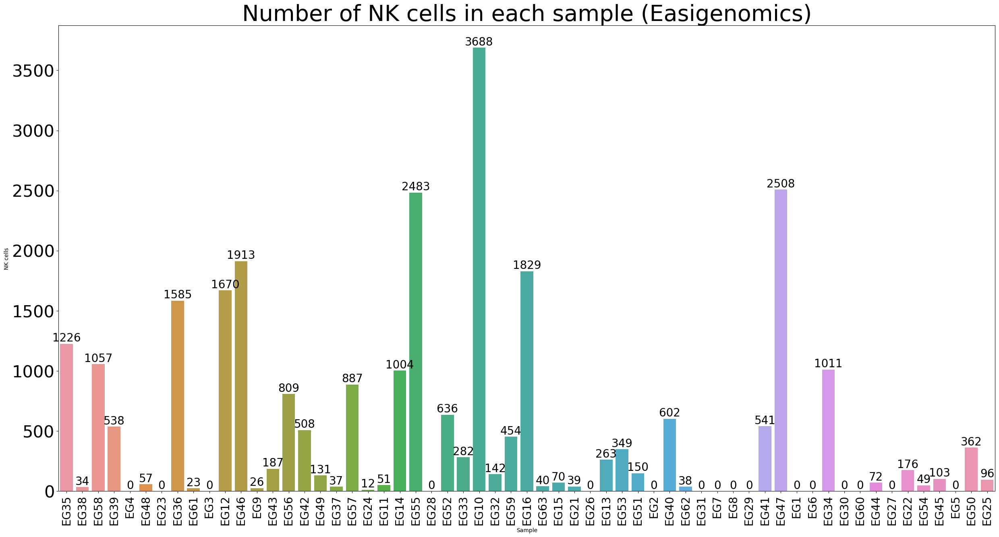

In [94]:
plt.figure(figsize=[30,15])

ax = sns.barplot(data=df_easi, x="Sample", y="NK cells")
ax.tick_params(axis='x', labelsize=20, rotation=90)
plt.title("Number of NK cells in each sample (Easigenomics)", fontsize=40) ;
ax.tick_params(axis='y', labelsize=30)
ax.bar_label(ax.containers[0],fontsize=20)


In [95]:
df_neurips_all= pd.DataFrame(all_cells_neurips)

df_neurips_all=df_neurips_all.T

df_neurips_all.columns=samples

df_neurips_nk= pd.DataFrame(nk_cell_neurips)

df_neurips_nk=df_neurips_nk.T

df_neurips_nk.columns=samples

df_neurips_nk

df_neurips=pd.concat([df_neurips_all, df_neurips_nk])

In [96]:
df_neurips.index = ['All cells', 'NK cells']

df_neurips=df_neurips.T

df_neurips["Sample"]=samples

df_neurips

,All cells,NK cells,Sample
s4d1,4885,665,s4d1
s3d6,10316,846,s3d6
s1d2,4450,518,s1d2
s2d1,9684,529,s2d1
s3d7,10802,1198,s3d7
s2d4,4575,151,s2d4
s1d1,4123,202,s1d1
s4d9,6565,730,s4d9
s4d8,3535,262,s4d8
s2d5,8725,1814,s2d5


[Text(0, 0, '4885'),
 Text(0, 0, '10316'),
 Text(0, 0, '4450'),
 Text(0, 0, '9684'),
 Text(0, 0, '10802'),
 Text(0, 0, '4575'),
 Text(0, 0, '4123'),
 Text(0, 0, '6565'),
 Text(0, 0, '3535'),
 Text(0, 0, '8725'),
 Text(0, 0, '8478'),
 Text(0, 0, '4860')]

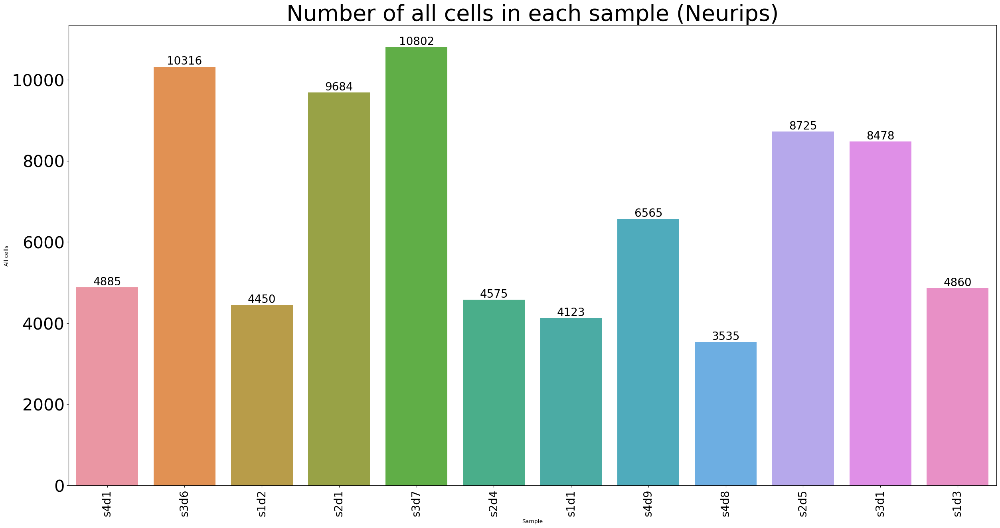

In [97]:
plt.figure(figsize=[30,15])

ax = sns.barplot(data=df_neurips, x="Sample", y="All cells")
ax.tick_params(axis='x', labelsize=20, rotation=90)
plt.title("Number of all cells in each sample (Neurips)", fontsize=40) ;
ax.tick_params(axis='y', labelsize=30)
ax.bar_label(ax.containers[0],fontsize=20)



[Text(0, 0, '665'),
 Text(0, 0, '846'),
 Text(0, 0, '518'),
 Text(0, 0, '529'),
 Text(0, 0, '1198'),
 Text(0, 0, '151'),
 Text(0, 0, '202'),
 Text(0, 0, '730'),
 Text(0, 0, '262'),
 Text(0, 0, '1814'),
 Text(0, 0, '210'),
 Text(0, 0, '263')]

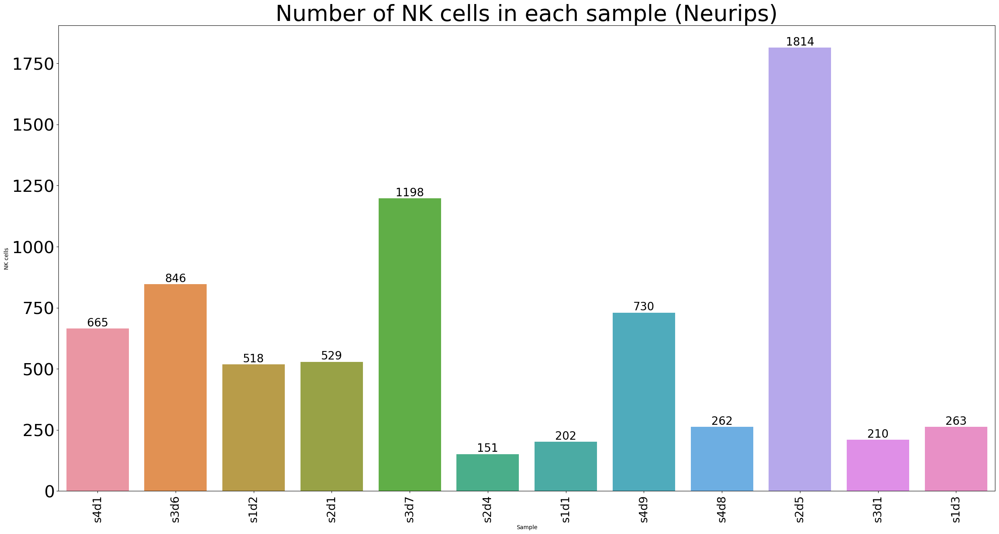

In [98]:
plt.figure(figsize=[30,15])

ax = sns.barplot(data=df_neurips, x="Sample", y="NK cells")
ax.tick_params(axis='x', labelsize=20, rotation=90)
plt.title("Number of NK cells in each sample (Neurips)", fontsize=40) ;
ax.tick_params(axis='y', labelsize=30)
ax.bar_label(ax.containers[0],fontsize=20)

In [99]:
df_granja_all= pd.DataFrame(all_cells_granja)

df_granja_all=df_granja_all.T

df_granja_all.columns=samples_g

df_granja_nk= pd.DataFrame(nk_cell_granja)

df_granja_nk=df_granja_nk.T

df_granja_nk.columns=samples_g

df_granja_nk

df_granja=pd.concat([df_granja_all, df_granja_nk])

In [100]:
df_granja.index = ['All cells', 'NK cells']

df_granja=df_granja.T

df_granja["Sample"]=samples_g

df_granja

,All cells,NK cells,Sample
GSM4138872,6194,517,GSM4138872
GSM4138873,6247,516,GSM4138873
GSM4138874,1856,0,GSM4138874
GSM4138880,5812,0,GSM4138880
GSM4138885,4095,0,GSM4138885


[Text(0, 0, '6194'),
 Text(0, 0, '6247'),
 Text(0, 0, '1856'),
 Text(0, 0, '5812'),
 Text(0, 0, '4095')]

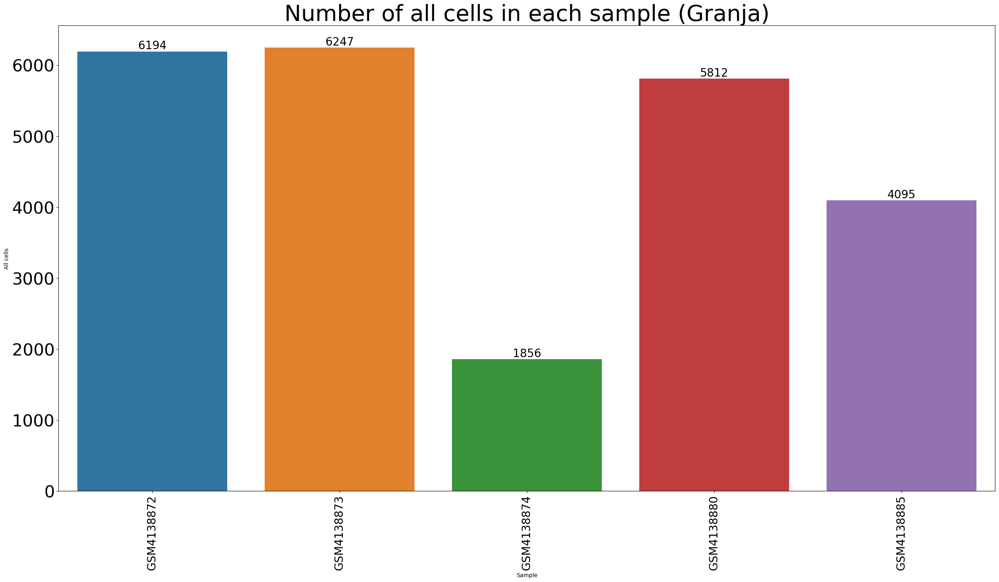

In [101]:
plt.figure(figsize=[30,15])

ax = sns.barplot(data=df_granja, x="Sample", y="All cells")
ax.tick_params(axis='x', labelsize=20, rotation=90)
plt.title("Number of all cells in each sample (Granja)", fontsize=40) ;
ax.tick_params(axis='y', labelsize=30)
ax.bar_label(ax.containers[0],fontsize=20)



[Text(0, 0, '517'),
 Text(0, 0, '516'),
 Text(0, 0, '0'),
 Text(0, 0, '0'),
 Text(0, 0, '0')]

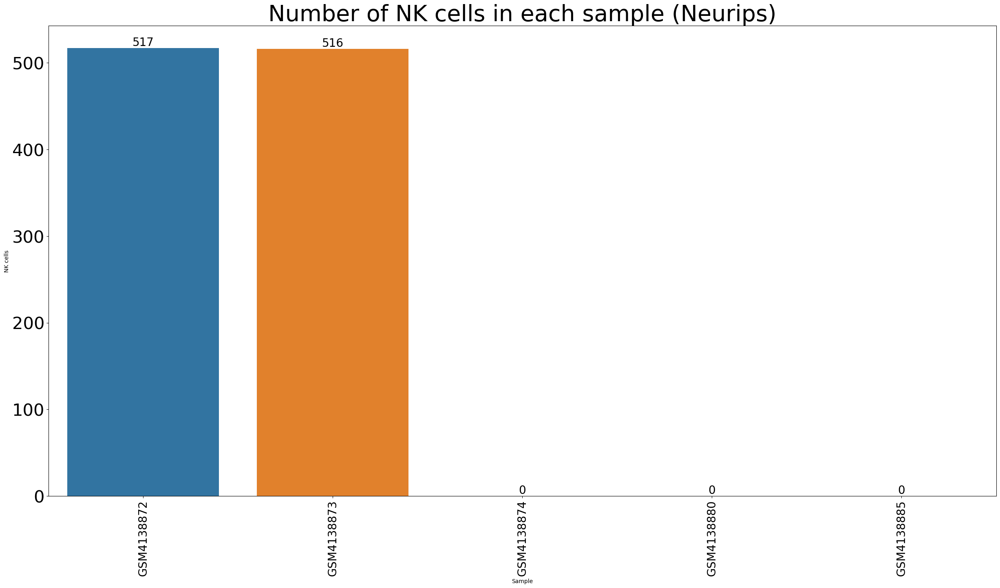

In [102]:
plt.figure(figsize=[30,15])

ax = sns.barplot(data=df_granja, x="Sample", y="NK cells")
ax.tick_params(axis='x', labelsize=20, rotation=90)
plt.title("Number of NK cells in each sample (Neurips)", fontsize=40) ;
ax.tick_params(axis='y', labelsize=30)
ax.bar_label(ax.containers[0],fontsize=20)

In [103]:
df_seurat_all= pd.DataFrame(all_cells_seurat)

df_seurat_all=df_seurat_all.T

df_seurat_all.columns=samples_s

df_seurat_nk= pd.DataFrame(nk_cell_seurat)

df_seurat_nk=df_seurat_nk.T

df_seurat_nk.columns=samples_s

df_seurat_nk


,Seurat
0,1355


In [104]:
df_seurat=pd.concat([df_seurat_all, df_seurat_nk])

df_seurat.index = ['All cells', 'NK cells']

df_seurat=df_seurat.T

df_seurat["Sample"]=samples_s

df_seurat

,All cells,NK cells,Sample
Seurat,29556,1355,Seurat


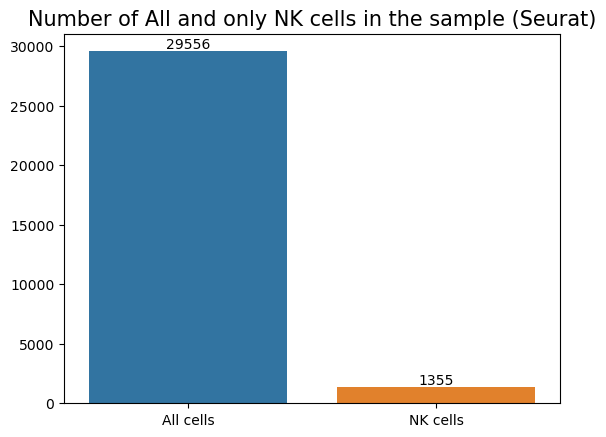

In [105]:
ax = sns.barplot(data=df_seurat)
ax.bar_label(ax.containers[0],fontsize=10)
plt.title("Number of All and only NK cells in the sample (Seurat)", fontsize=15) ;